Comparativa entre simulación (sin defectos) y pieza real (puede tener deefctos)

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

In [41]:
!python -m pip install torchvision
!python -m pip install opencv-python


[notice] A new release of pip is available: 23.1.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.1.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Definimos una función para cargar y preprocesar las imágenes

def carga_y_preprocesamiento(folder, img_size=(988, 593), depth_limit=512):
    files = sorted(os.listdir(folder))
    if depth_limit:
        files = files[:depth_limit]

    stack = []
    for file in files:
        path = os.path.join(folder, file)
        img = cv2.imread(path)  # BGR
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir a RGB
        img = cv2.resize(img, img_size)
        img = img.astype("float32") / 255.0  # Normalizar
        img = np.transpose(img, (2, 0, 1))  # (H, W, C) → (C, H, W)
        stack.append(img)

    volume = np.stack(stack, axis=1)  # (C, D, H, W)
    tensor = torch.tensor(volume, dtype=torch.float32)
    return tensor  # shape: (3, depth, height, width)

In [4]:
# Vamos a cargar las imágenes

Simulacion_nudo_1 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_1', depth_limit=None)
Simulacion_nudo_2 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_2', depth_limit=None)
Simulacion_nudo_3 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_3', depth_limit=None)
Simulacion_nudo_4 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_4', depth_limit=None)
Simulacion_nudo_5 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_5', depth_limit=None)

Real_nudo_1 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_1', depth_limit=None)
Real_nudo_2 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_2', depth_limit=None)
Real_nudo_3 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_3', depth_limit=None)
Real_nudo_4 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_4', depth_limit=None)
Real_nudo_5 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_5', depth_limit=None)

# Añadir dimensión de batch → (1, 3, D, H, W)

Simulacion_nudo_1 = Simulacion_nudo_1.unsqueeze(0)
Simulacion_nudo_2 = Simulacion_nudo_2.unsqueeze(0)
Simulacion_nudo_3 = Simulacion_nudo_3.unsqueeze(0)
Simulacion_nudo_4 = Simulacion_nudo_4.unsqueeze(0)
Simulacion_nudo_5 = Simulacion_nudo_5.unsqueeze(0)

# Concatenamos las simulaciones para entrenar la red
simulaciones=torch.cat([
    Simulacion_nudo_1,
    Simulacion_nudo_2,
    Simulacion_nudo_3,
    Simulacion_nudo_4,
    Simulacion_nudo_5
], dim=0)  


Real_nudo_1 = Real_nudo_1.unsqueeze(0)
Real_nudo_2 = Real_nudo_2.unsqueeze(0)
Real_nudo_3 = Real_nudo_3.unsqueeze(0)
Real_nudo_4 = Real_nudo_4.unsqueeze(0)
Real_nudo_5 = Real_nudo_5.unsqueeze(0)

In [44]:
Real_nudo_1.shape

torch.Size([1, 3, 100, 593, 988])

Vamos a usar una arquitectura autoencoder (encoder-decoder). Esta red aprende a comprimir y reconstruir las imágenes de entrada. La idea es entonces entrenar a la red con las simulaciones sin defectos, y luego pasarle las imágenes con defectos. De esta forma, fallará a la hora de la reconstrucció en los poros, y podremos identificar los defectos como las zonas con mayores defectos en la reconstrucción.

In [5]:

BATCH_SIZE = 32
EPOCHS = 50
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Vamos a definir un autoencoder para hacer la comparativa entre imágenes

class Autoencoder3D(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv3d(3, 8, kernel_size=3, stride=2, padding=1), nn.ReLU(),
            nn.Conv3d(8, 16, kernel_size=3, stride=2, padding=1), nn.ReLU(),
            nn.Conv3d(16, 32, kernel_size=3, stride=2, padding=1), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose3d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1), nn.ReLU(),
            nn.ConvTranspose3d(16, 8, kernel_size=3, stride=2, padding=1, output_padding=1), nn.ReLU(),
            nn.ConvTranspose3d(8, 3, kernel_size=3, stride=2, padding=1, output_padding=1), nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        print(x.shape)
        x = self.decoder(x)
        print(x.shape)
        return x


In [7]:

# Vamos a entrenar nuestro modelo
model = Autoencoder3D().to(DEVICE)

input_tensor = simulaciones.to(DEVICE)  


# Definimos la pérdida y el optimizador
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
input_tensor = input_tensor[:, :, :96, :, :]

# Entrenamiento
EPOCHS = 50
model.train()
for epoch in range(EPOCHS):
    optimizer.zero_grad()
    
    output = model(input_tensor)
   
    mask = (input_tensor.sum(dim=1, keepdim=True) > 0.01).float()  # Máscara de voxels no-negros
    if output.shape != input_tensor.shape:
    # Recortamos la salida para que coincida con la entrada (evitamos errores de tamaño)
        min_D = min(output.shape[2], input_tensor.shape[2])
        min_H = min(output.shape[3], input_tensor.shape[3])
        min_W = min(output.shape[4], input_tensor.shape[4])
        output = output[:, :, :min_D, :min_H, :min_W]
        input_tensor = input_tensor[:, :, :min_D, :min_H, :min_W]
    loss = (((output - input_tensor) ** 2) * mask).sum() / mask.sum()
    
    loss.backward()
    optimizer.step()
    
    print(f"Epoch {epoch+1}/{EPOCHS} - Loss: {loss.item():.6f}")

torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 1/50 - Loss: 0.526537
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 2/50 - Loss: 0.525900
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 3/50 - Loss: 0.525270
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 4/50 - Loss: 0.524639
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 5/50 - Loss: 0.524004
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 6/50 - Loss: 0.523359
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 7/50 - Loss: 0.522700
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 8/50 - Loss: 0.522019
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 9/50 - Loss: 0.521314
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 10/50 - Loss: 0.520579
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600,

In [8]:
input_def = Real_nudo_1.to(DEVICE)  

input_def = input_def[:, :, :96, :, :] # más de 96 no deja, no se el motivo
output_def = model(input_def).detach().cpu()
# Recorta la salida para que coincida con la entrada
if output_def.shape != input_def.cpu().shape:
    min_D = min(output_def.shape[2], input_def.shape[2])
    min_H = min(output_def.shape[3], input_def.shape[3])
    min_W = min(output_def.shape[4], input_def.shape[4])
    output_def = output_def[:, :, :min_D, :min_H, :min_W]
    input_def = input_def[:, :, :min_D, :min_H, :min_W]
# Calculamos el mapa de error
error_map = torch.abs(input_def.cpu() - output_def)


torch.Size([1, 32, 12, 75, 124])
torch.Size([1, 3, 96, 600, 992])


Número de píxeles con defecto (solo interior de la pieza): 7321.0
Slice 0: 324 píxeles con defecto


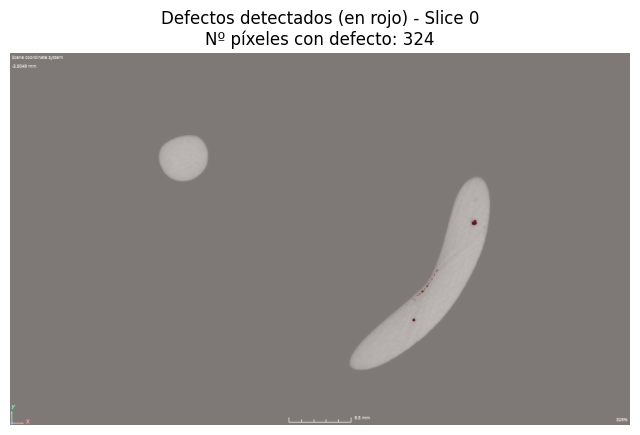

Slice 1: 197 píxeles con defecto


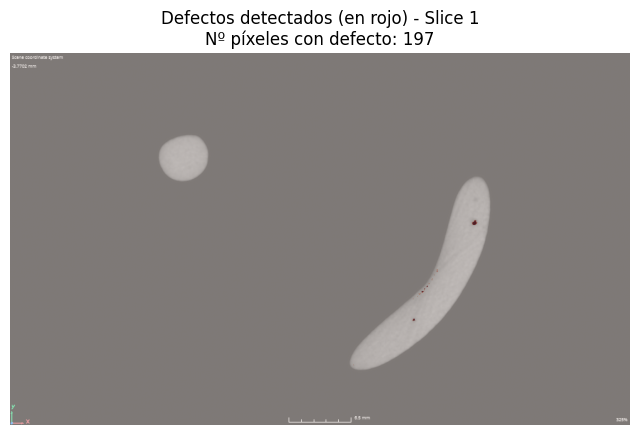

Slice 2: 140 píxeles con defecto


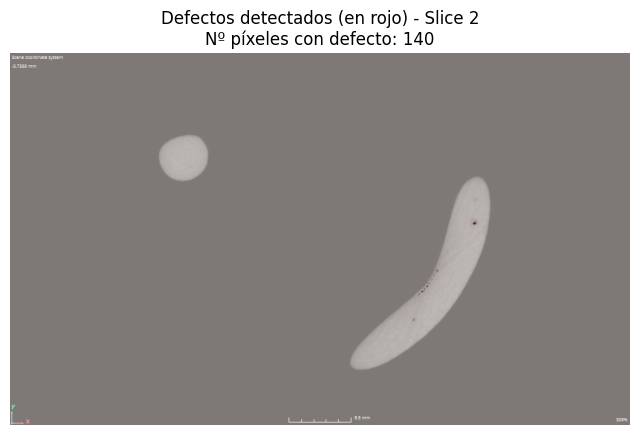

Slice 3: 47 píxeles con defecto


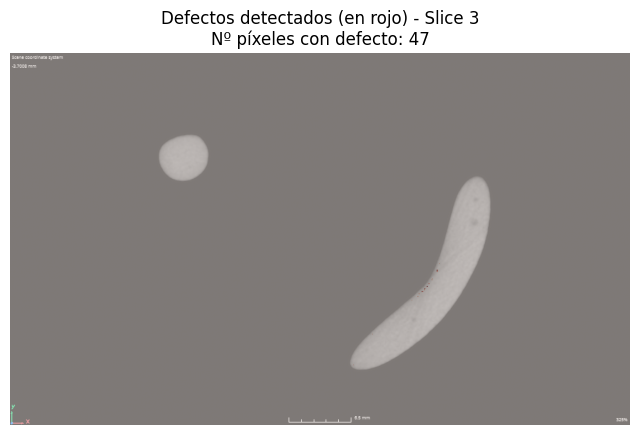

Slice 4: 98 píxeles con defecto


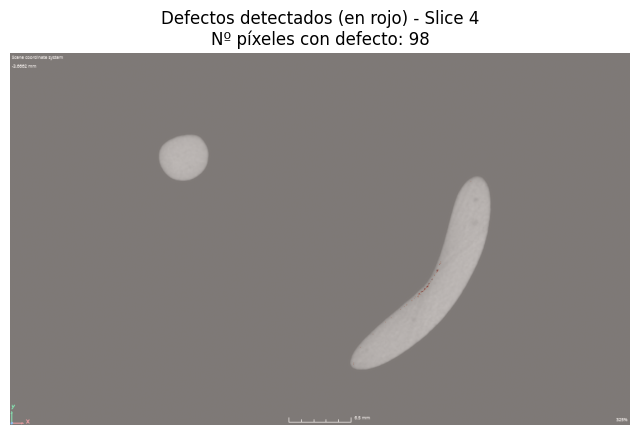

Slice 5: 50 píxeles con defecto


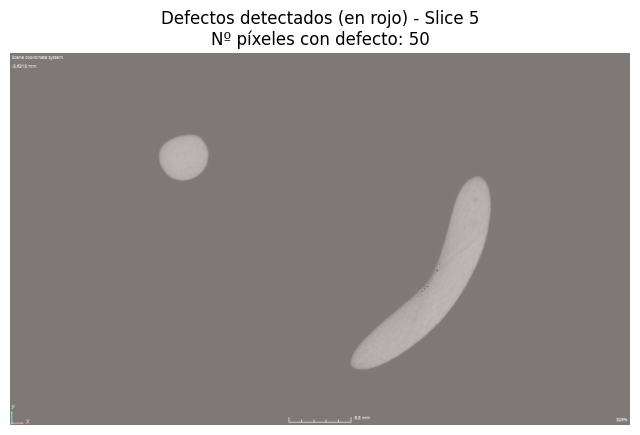

Slice 6: 93 píxeles con defecto


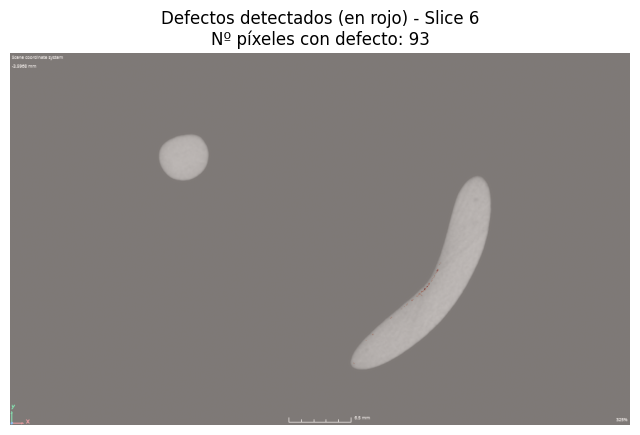

Slice 7: 55 píxeles con defecto


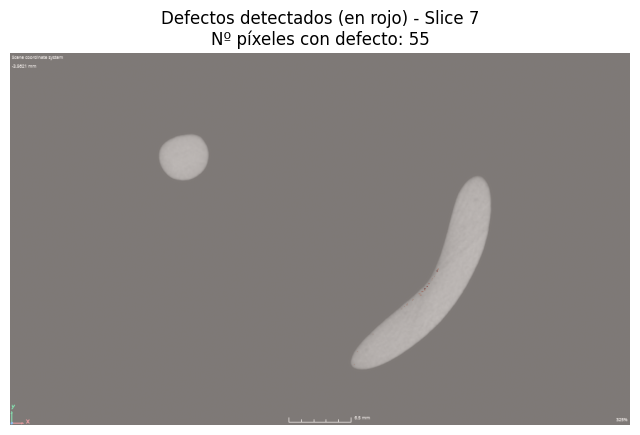

Slice 8: 108 píxeles con defecto


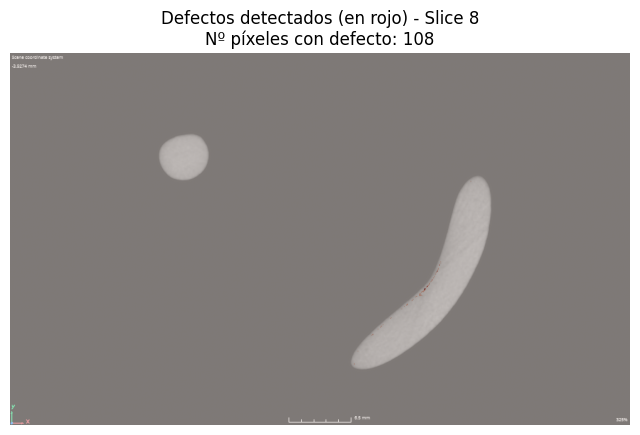

Slice 9: 57 píxeles con defecto


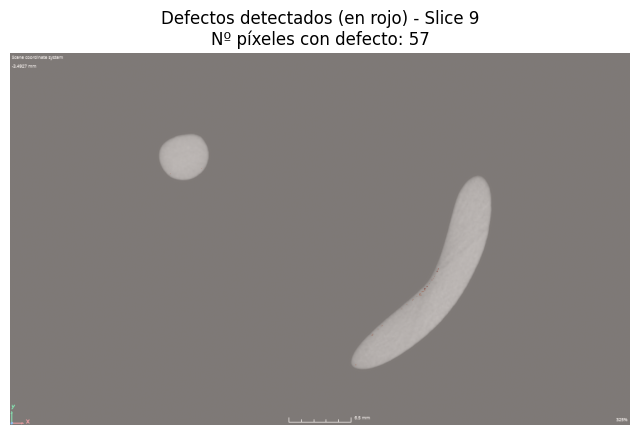

Slice 10: 110 píxeles con defecto


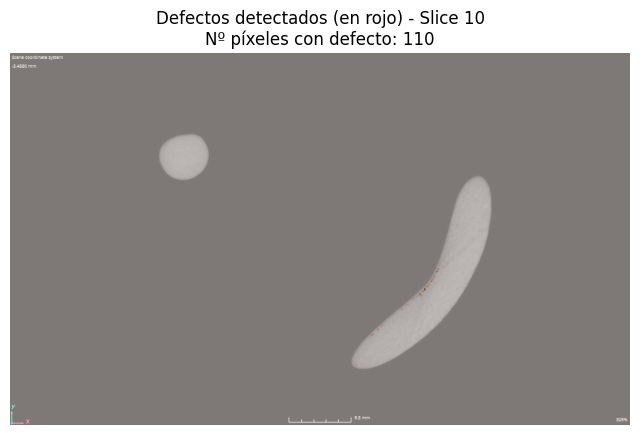

Slice 11: 70 píxeles con defecto


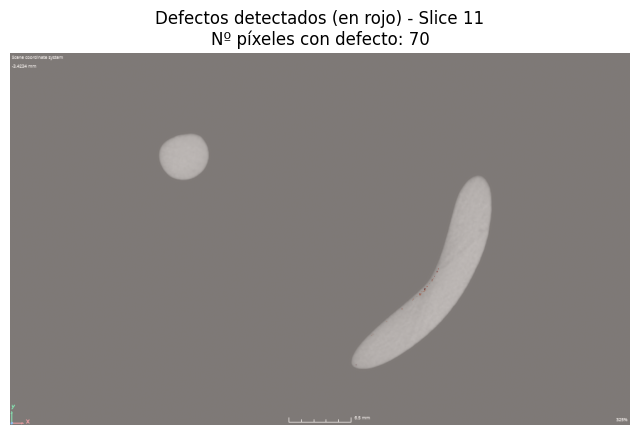

Slice 12: 113 píxeles con defecto


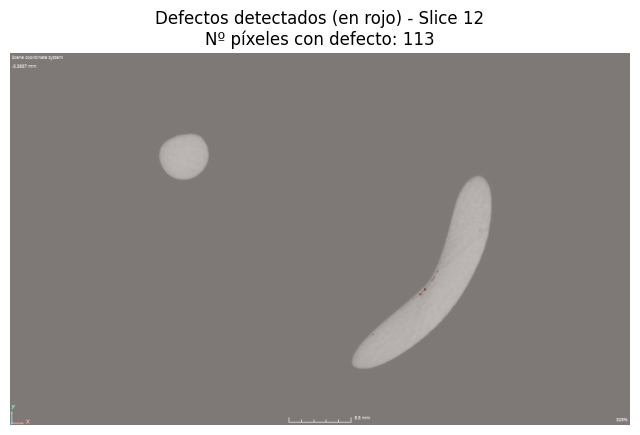

Slice 13: 62 píxeles con defecto


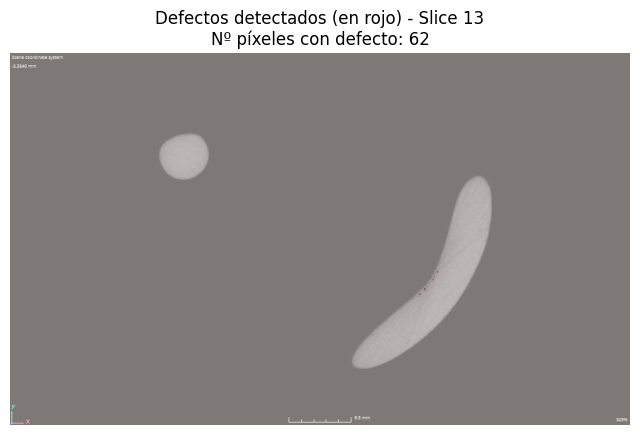

Slice 14: 100 píxeles con defecto


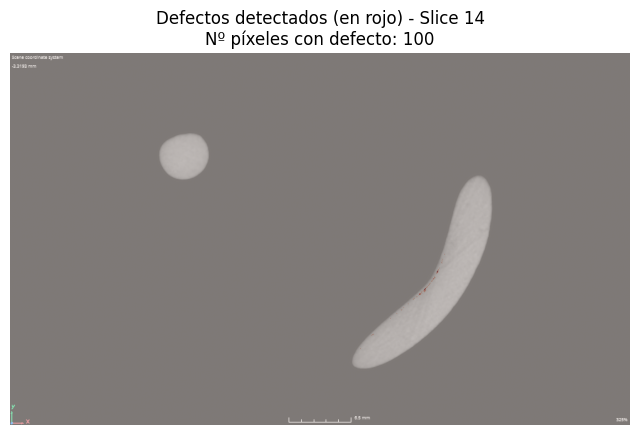

Slice 15: 52 píxeles con defecto


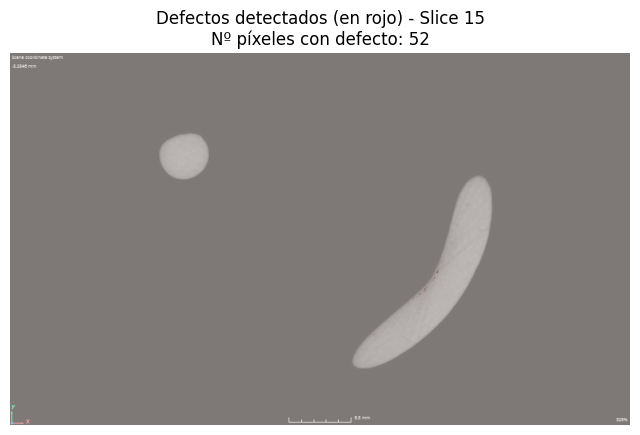

Slice 16: 107 píxeles con defecto


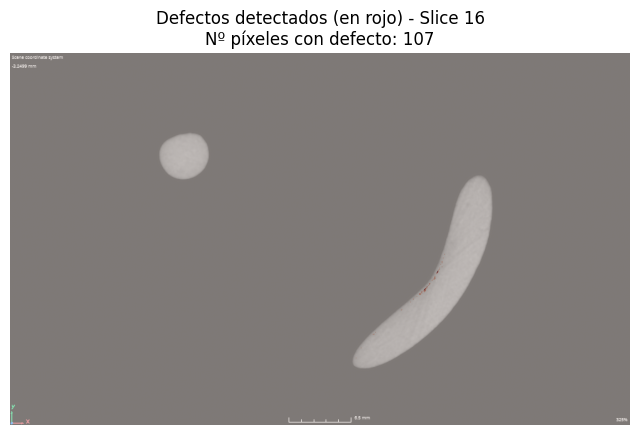

Slice 17: 60 píxeles con defecto


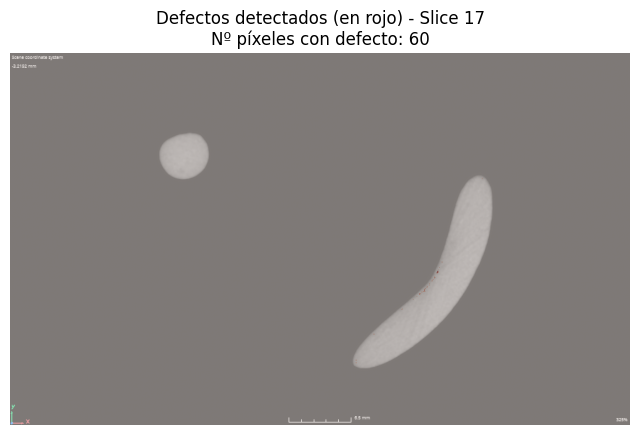

Slice 18: 97 píxeles con defecto


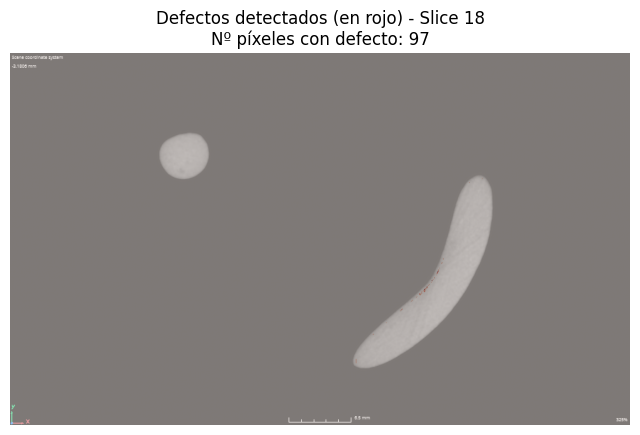

Slice 19: 60 píxeles con defecto


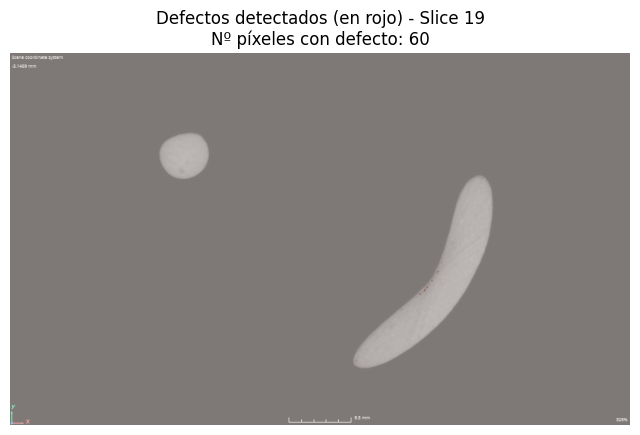

Slice 20: 106 píxeles con defecto


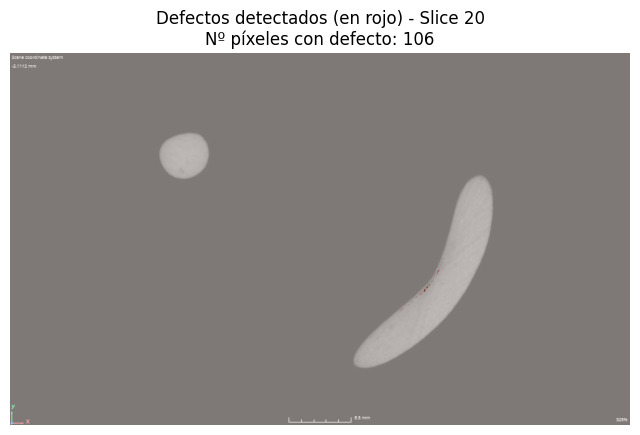

Slice 21: 44 píxeles con defecto


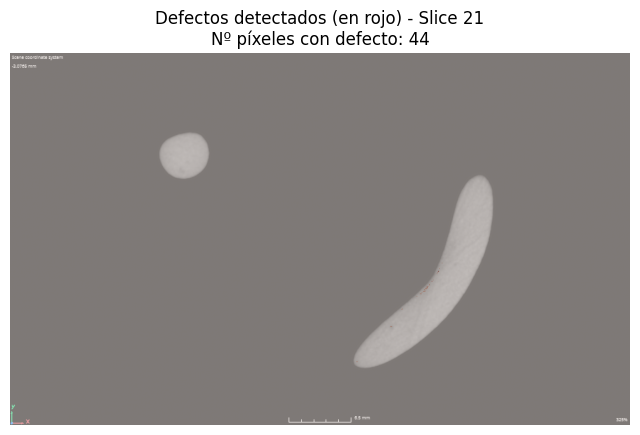

Slice 22: 94 píxeles con defecto


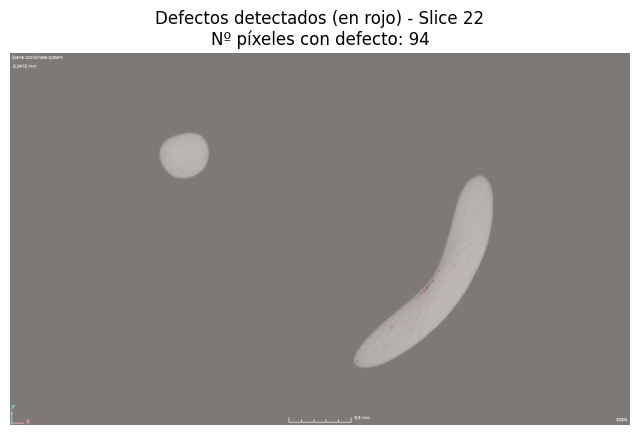

Slice 23: 50 píxeles con defecto


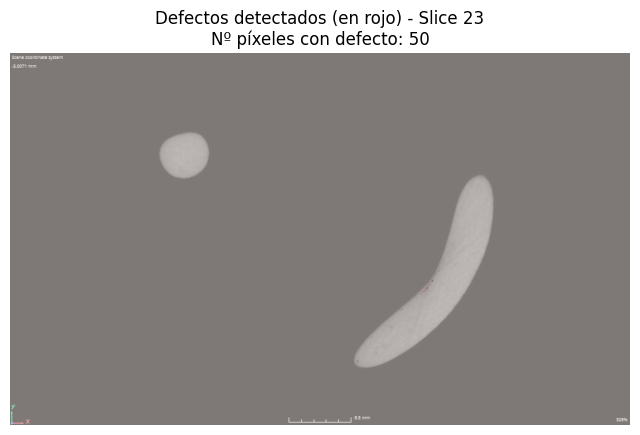

Slice 24: 113 píxeles con defecto


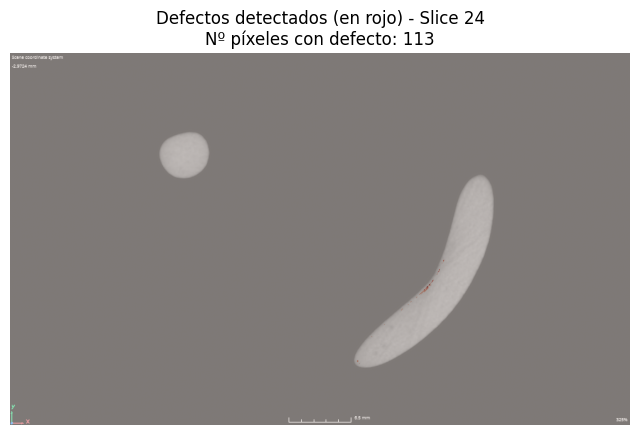

Slice 25: 35 píxeles con defecto


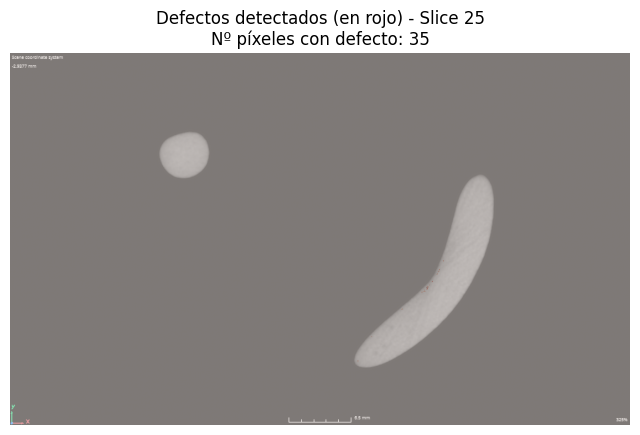

Slice 26: 79 píxeles con defecto


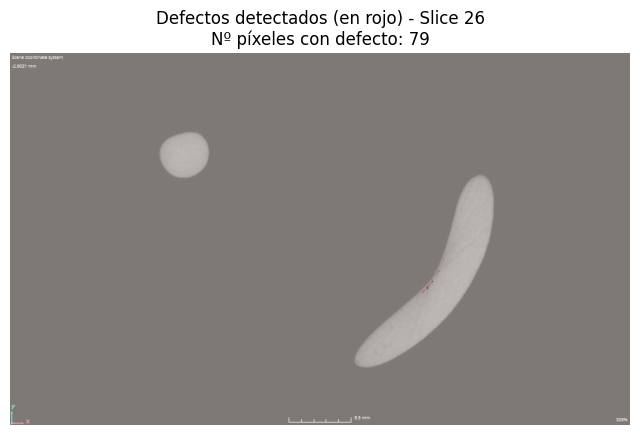

Slice 27: 47 píxeles con defecto


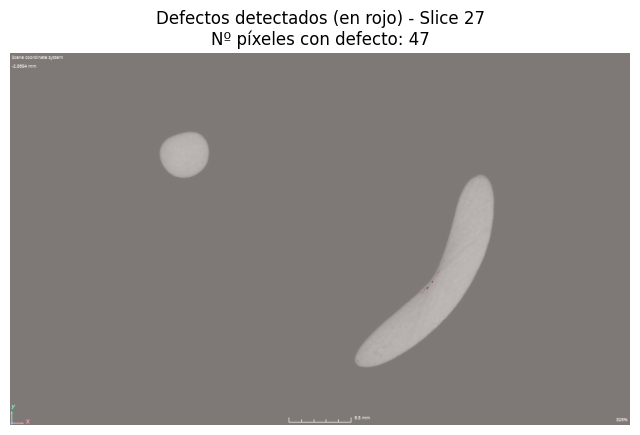

Slice 28: 110 píxeles con defecto


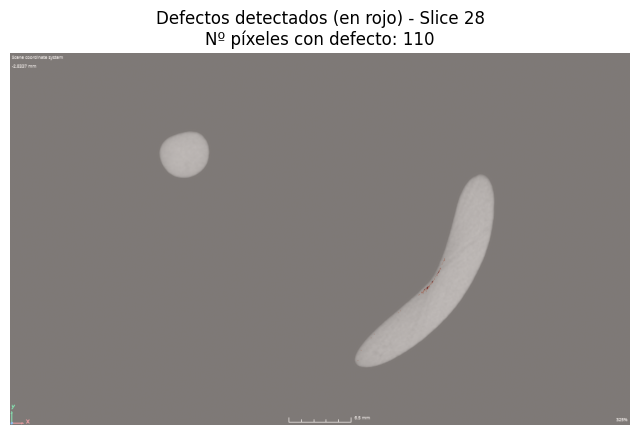

Slice 29: 41 píxeles con defecto


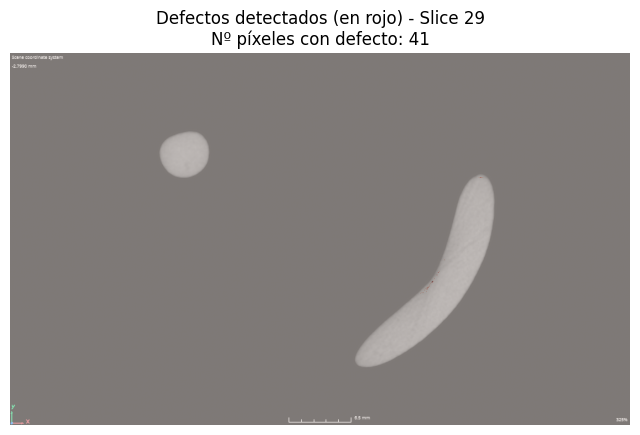

Slice 30: 79 píxeles con defecto


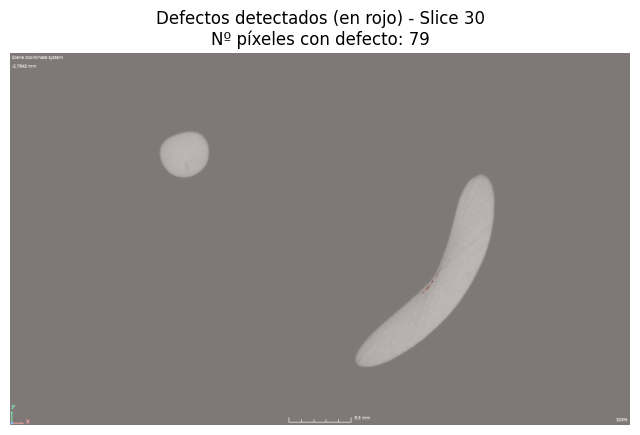

Slice 31: 35 píxeles con defecto


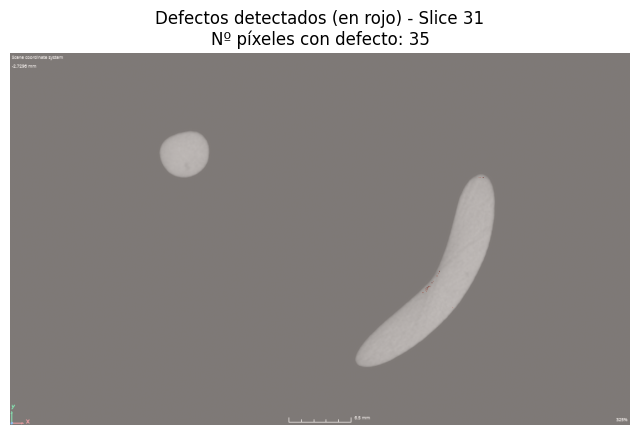

Slice 32: 80 píxeles con defecto


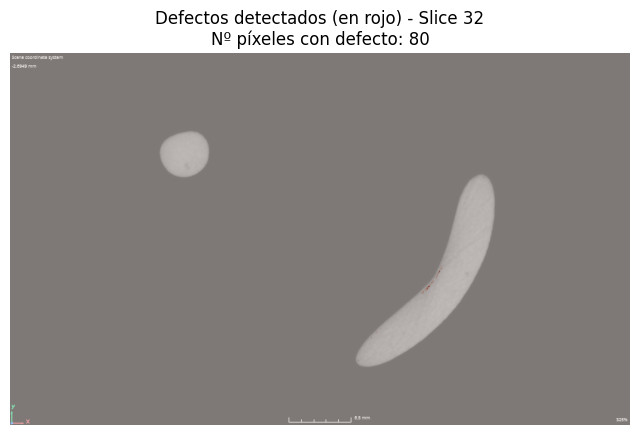

Slice 33: 32 píxeles con defecto


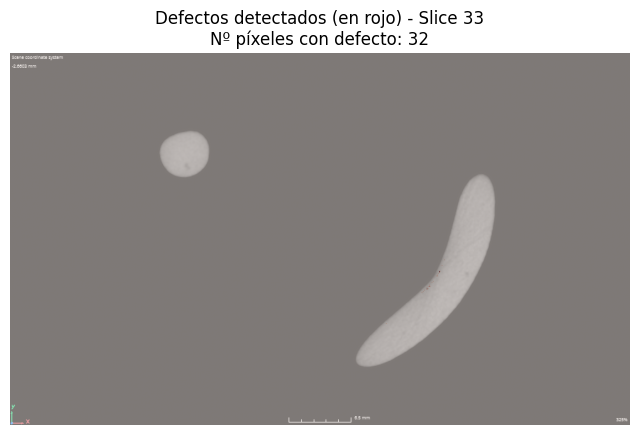

Slice 34: 81 píxeles con defecto


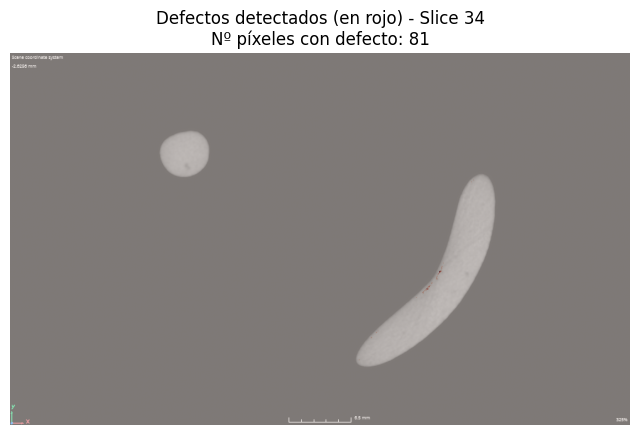

Slice 35: 68 píxeles con defecto


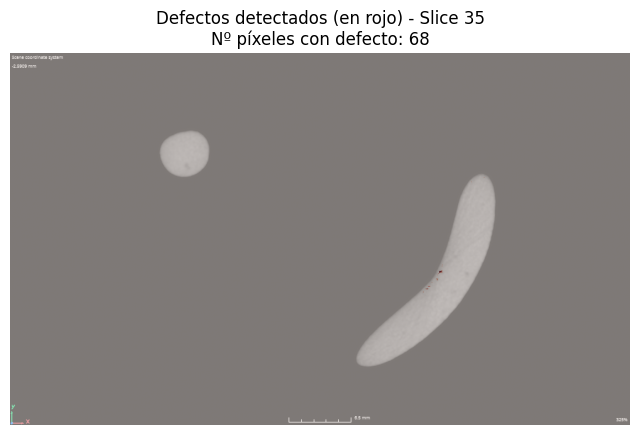

Slice 36: 114 píxeles con defecto


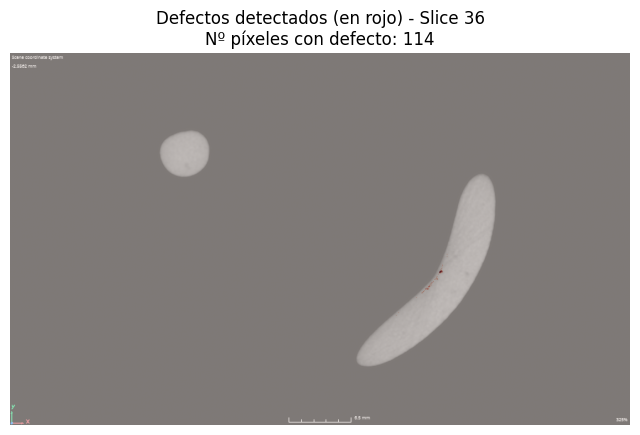

Slice 37: 57 píxeles con defecto


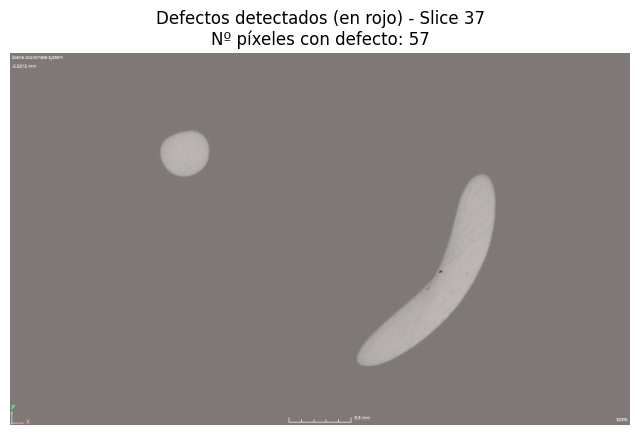

Slice 38: 84 píxeles con defecto


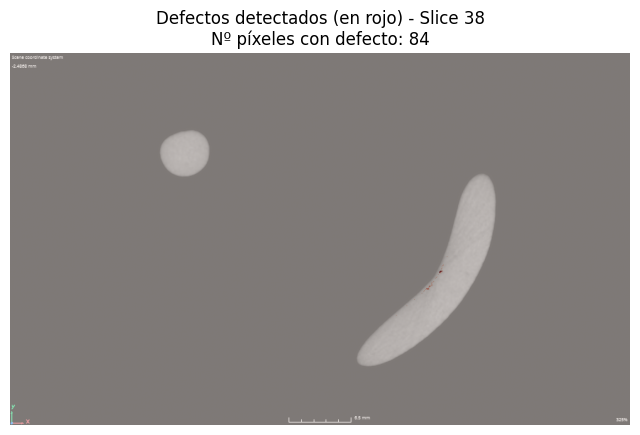

Slice 39: 40 píxeles con defecto


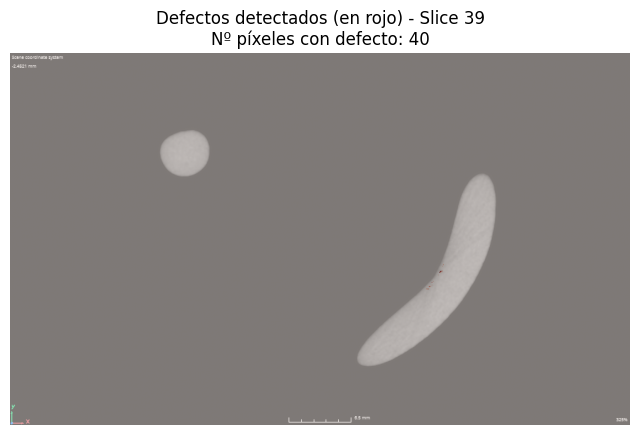

Slice 40: 79 píxeles con defecto


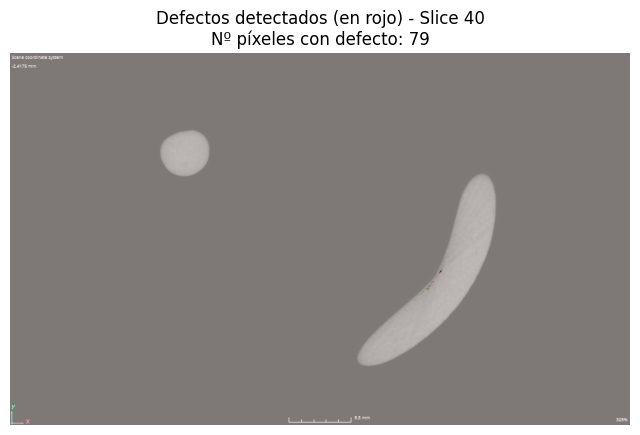

Slice 41: 38 píxeles con defecto


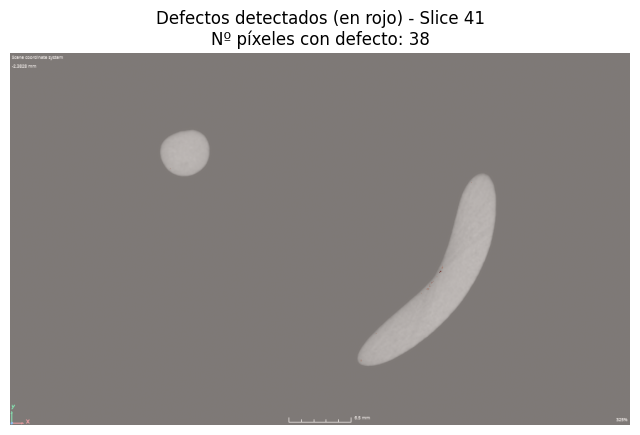

Slice 42: 67 píxeles con defecto


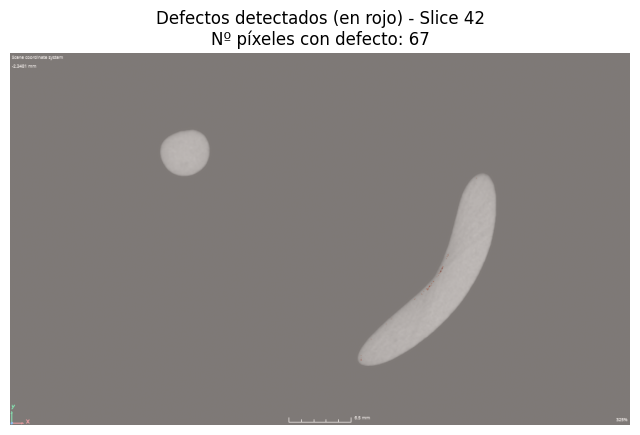

Slice 43: 29 píxeles con defecto


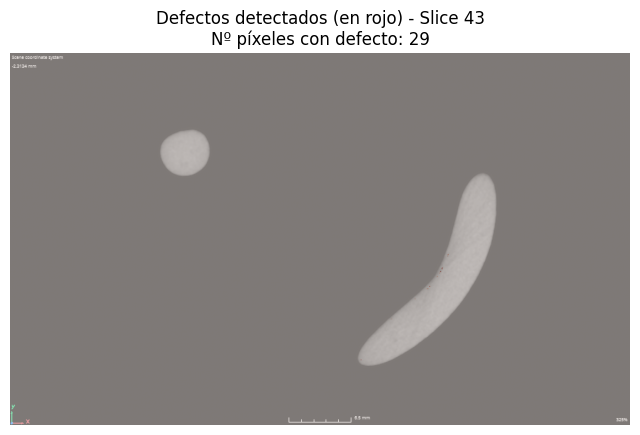

Slice 44: 73 píxeles con defecto


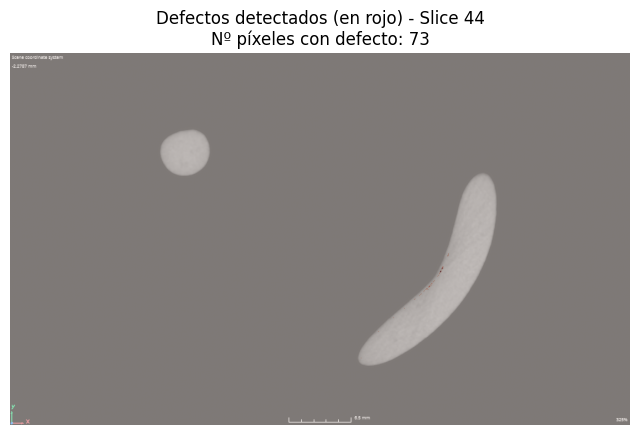

Slice 45: 34 píxeles con defecto


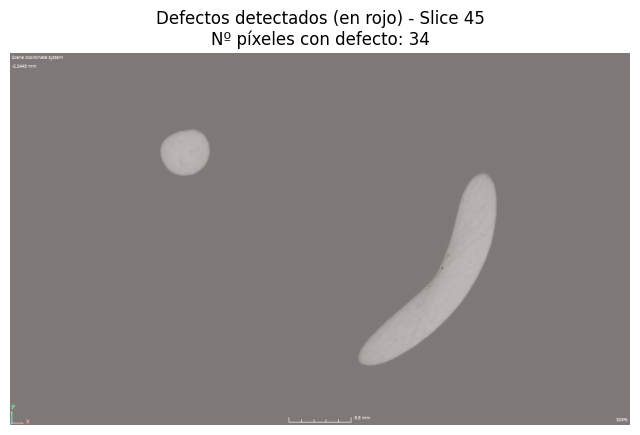

Slice 46: 80 píxeles con defecto


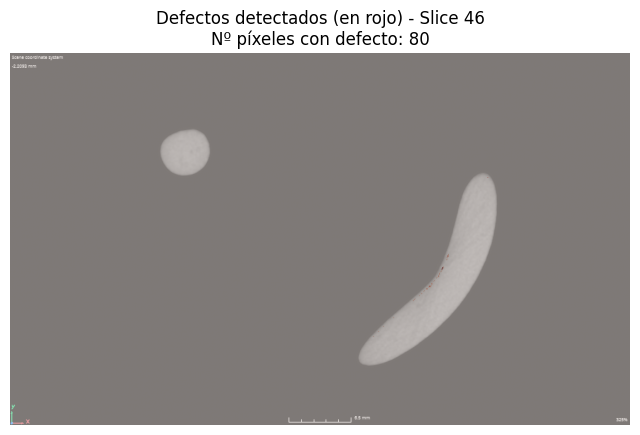

Slice 47: 44 píxeles con defecto


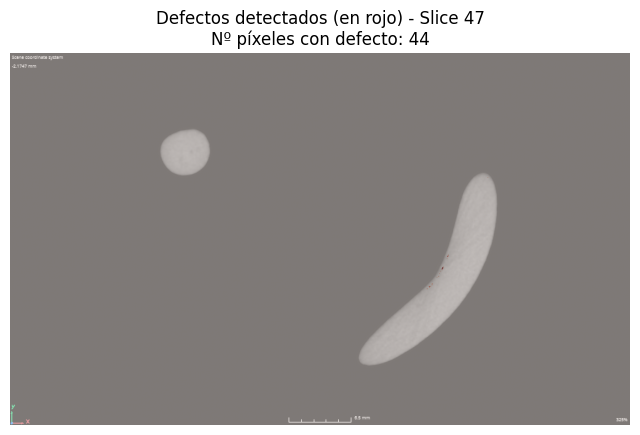

Slice 48: 91 píxeles con defecto


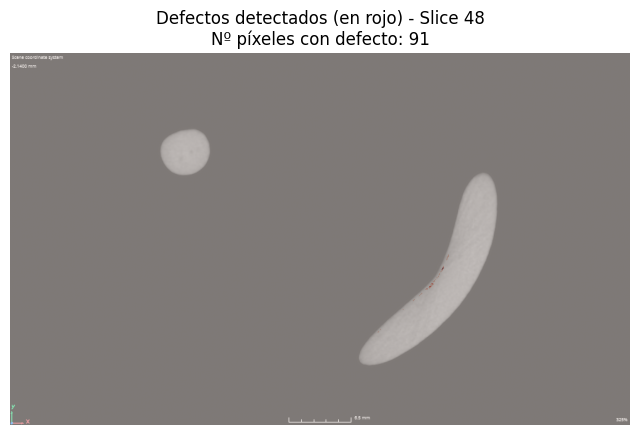

Slice 49: 53 píxeles con defecto


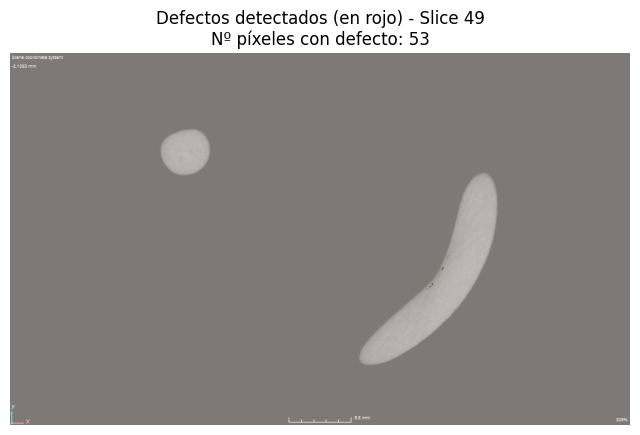

Slice 50: 99 píxeles con defecto


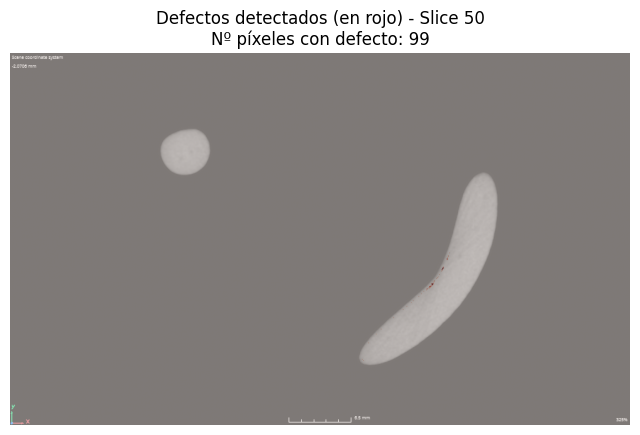

Slice 51: 52 píxeles con defecto


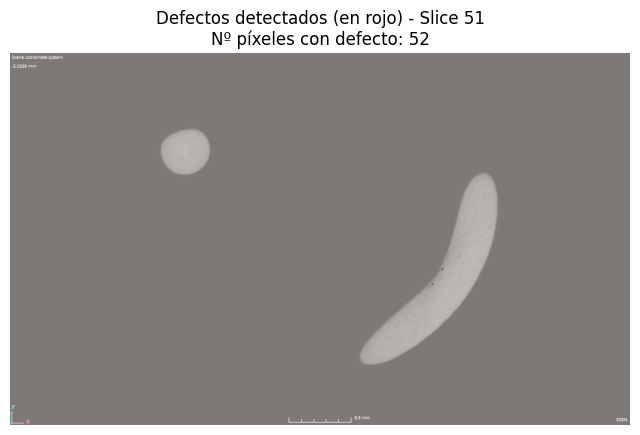

Slice 52: 83 píxeles con defecto


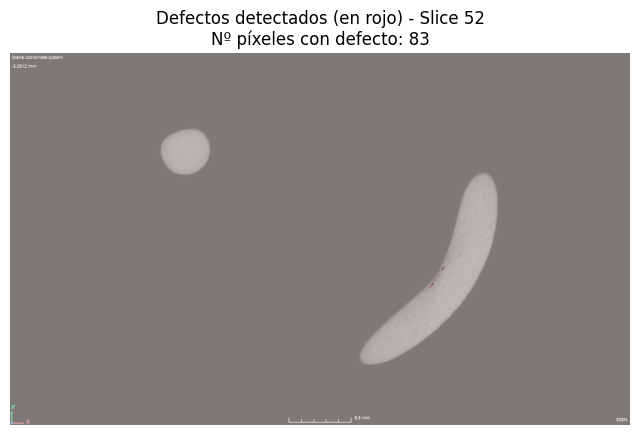

Slice 53: 47 píxeles con defecto


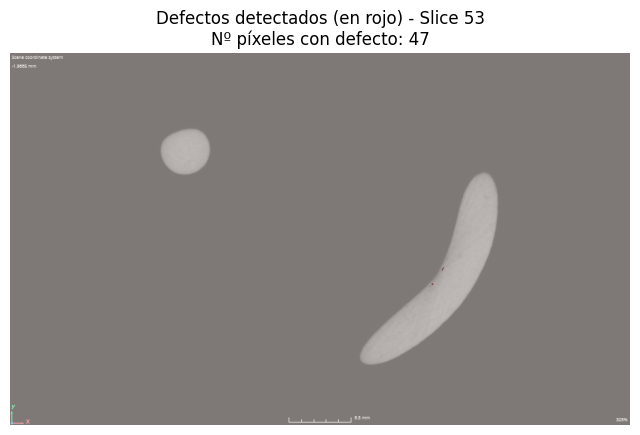

Slice 54: 63 píxeles con defecto


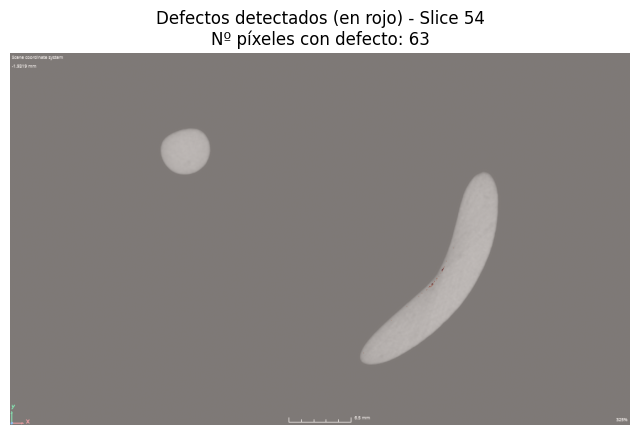

Slice 55: 29 píxeles con defecto


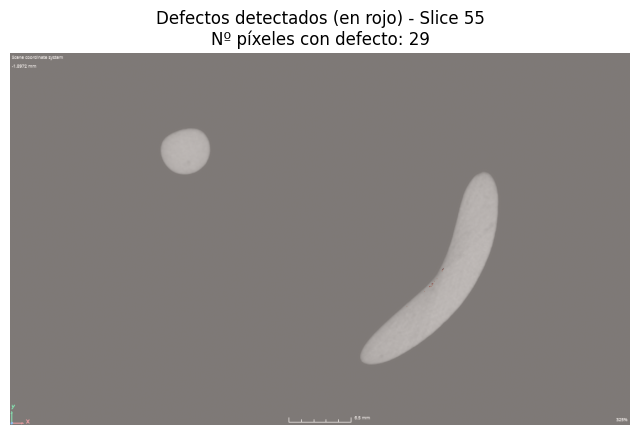

Slice 56: 66 píxeles con defecto


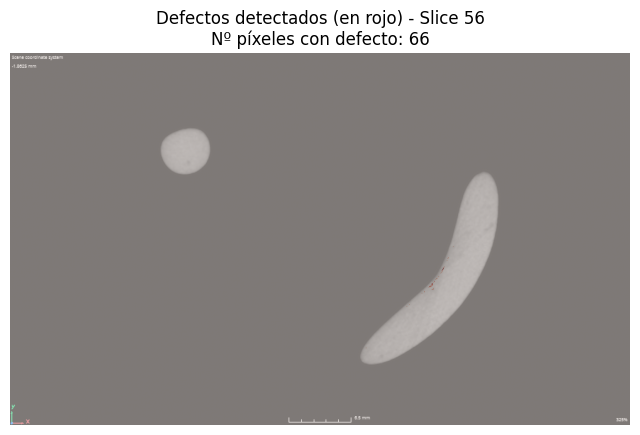

Slice 57: 30 píxeles con defecto


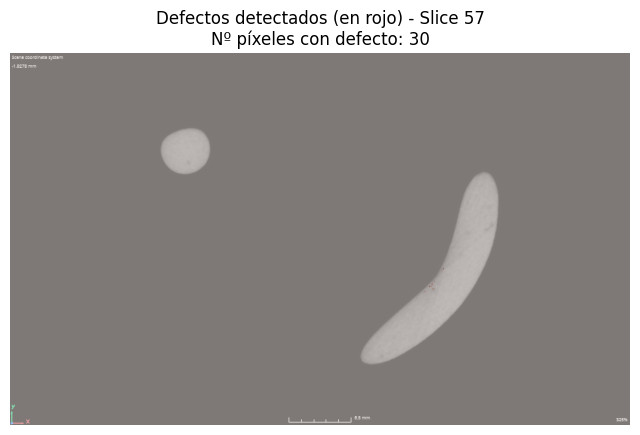

Slice 58: 57 píxeles con defecto


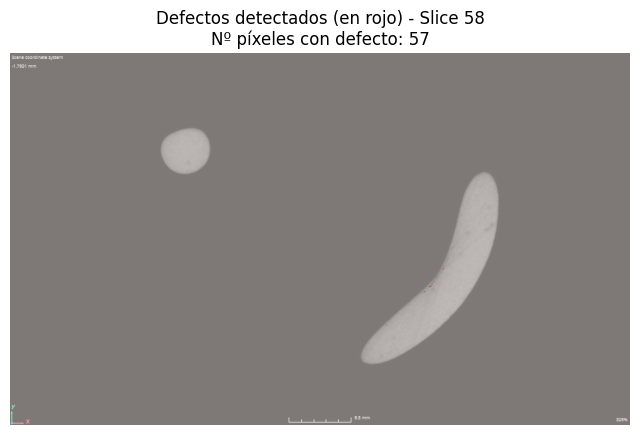

Slice 59: 29 píxeles con defecto


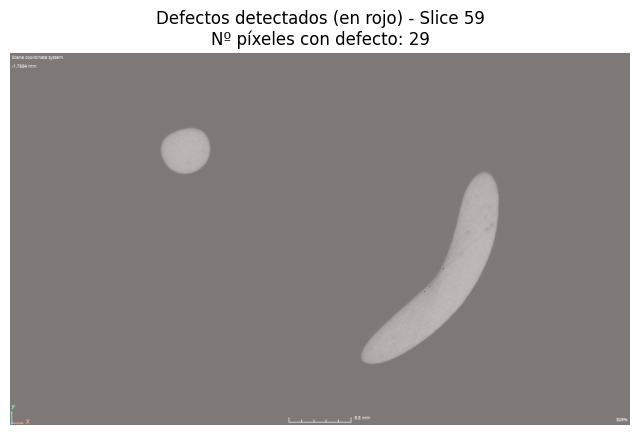

Slice 60: 54 píxeles con defecto


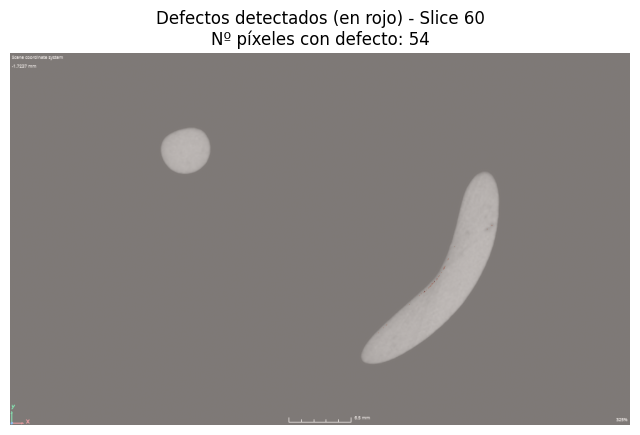

Slice 61: 22 píxeles con defecto


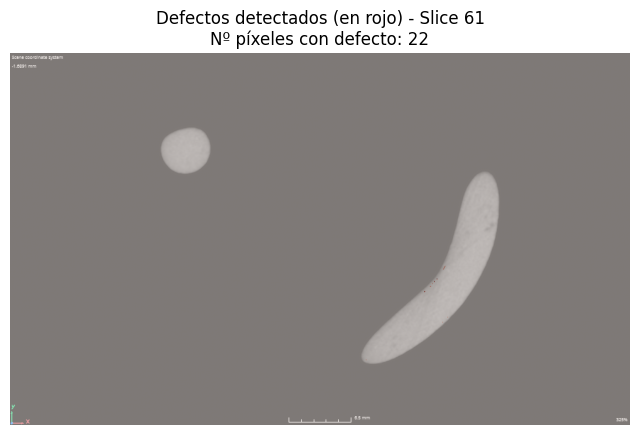

Slice 62: 42 píxeles con defecto


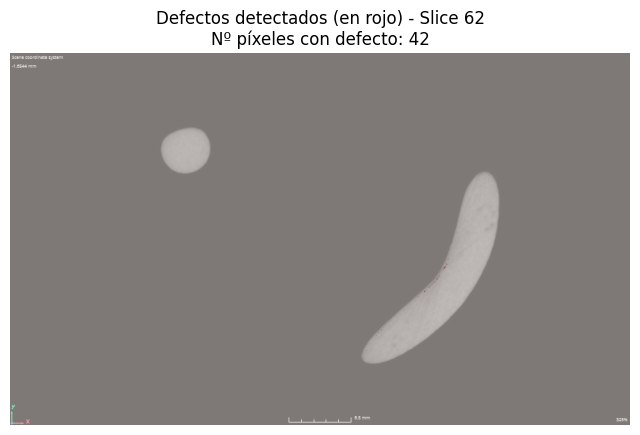

Slice 63: 23 píxeles con defecto


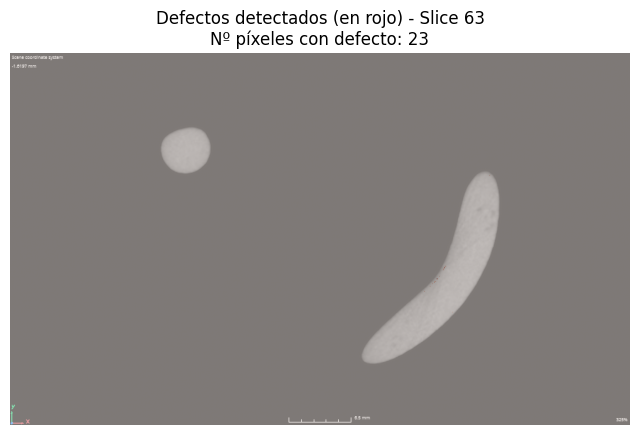

Slice 64: 62 píxeles con defecto


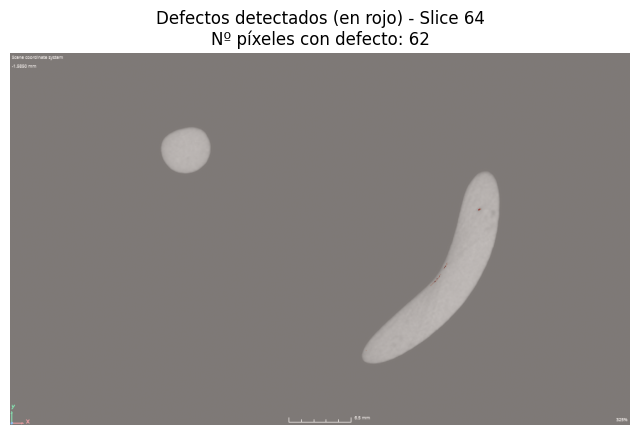

Slice 65: 67 píxeles con defecto


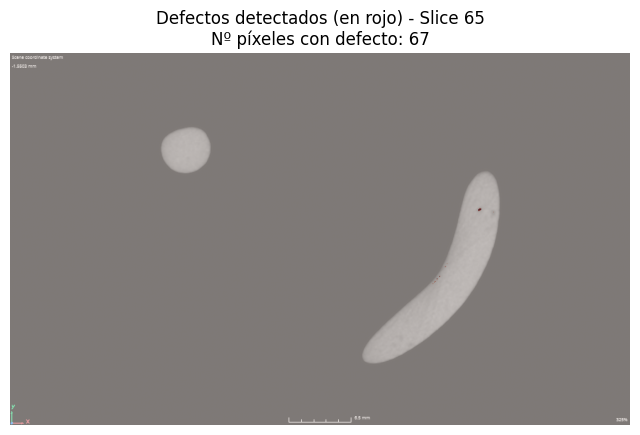

Slice 66: 127 píxeles con defecto


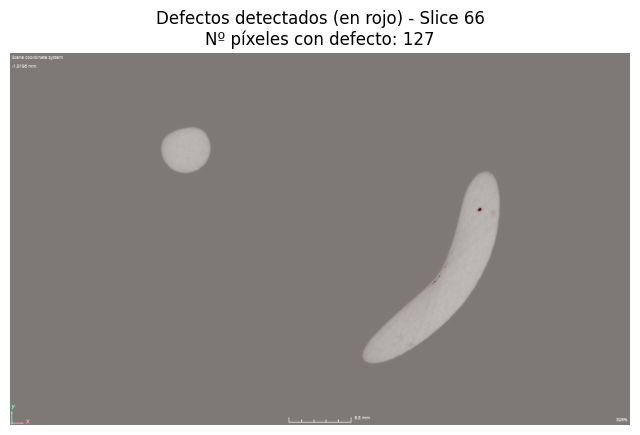

Slice 67: 118 píxeles con defecto


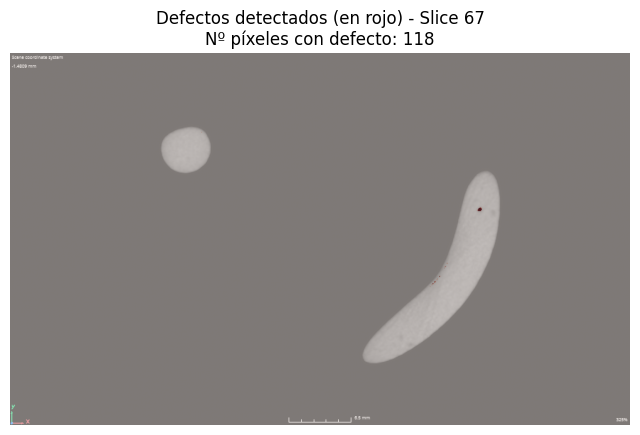

Slice 68: 180 píxeles con defecto


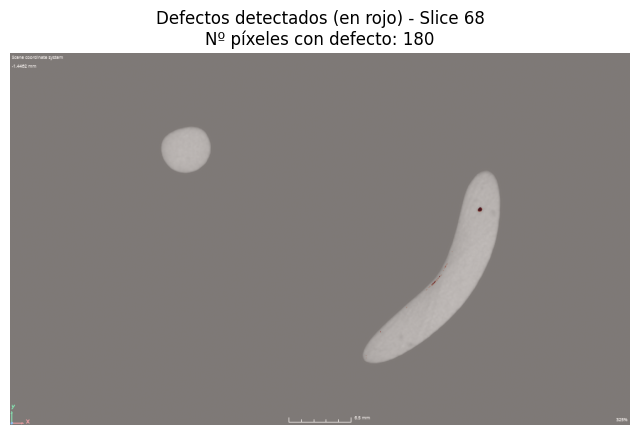

Slice 69: 99 píxeles con defecto


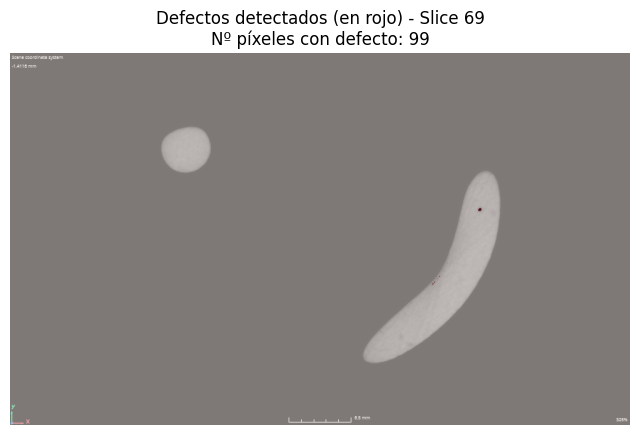

Slice 70: 87 píxeles con defecto


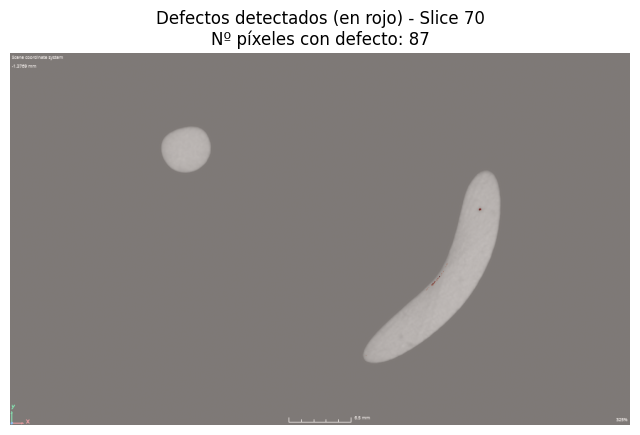

Slice 71: 35 píxeles con defecto


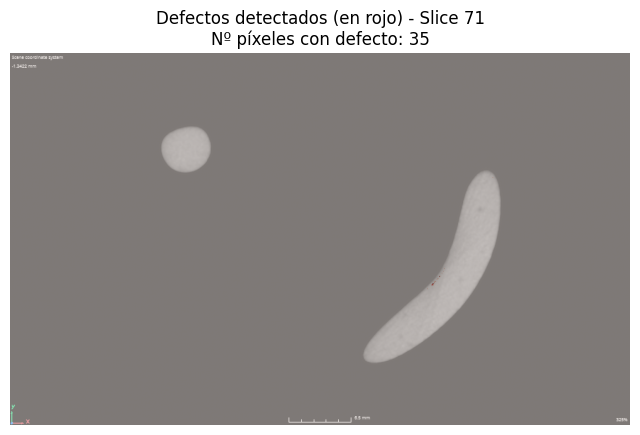

Slice 72: 75 píxeles con defecto


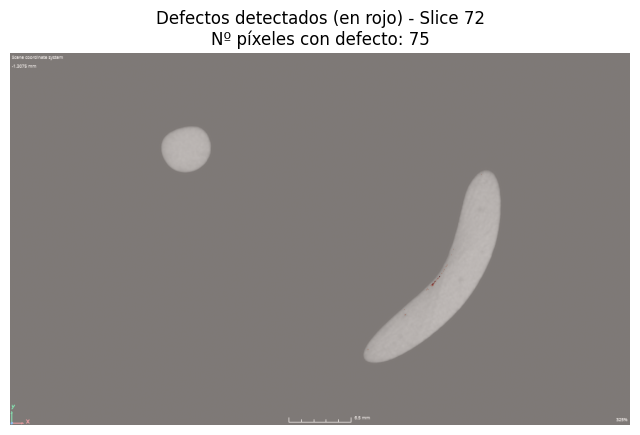

Slice 73: 63 píxeles con defecto


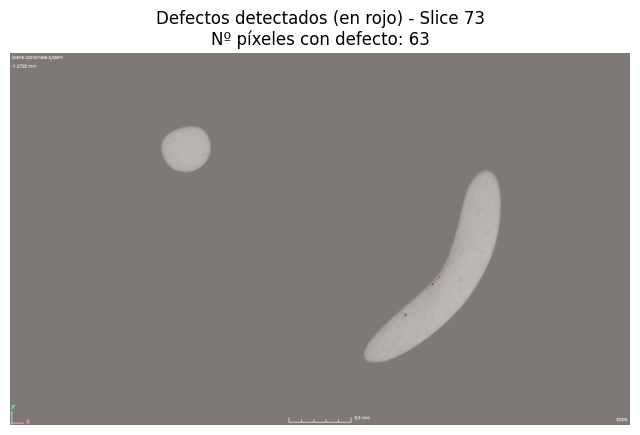

Slice 74: 110 píxeles con defecto


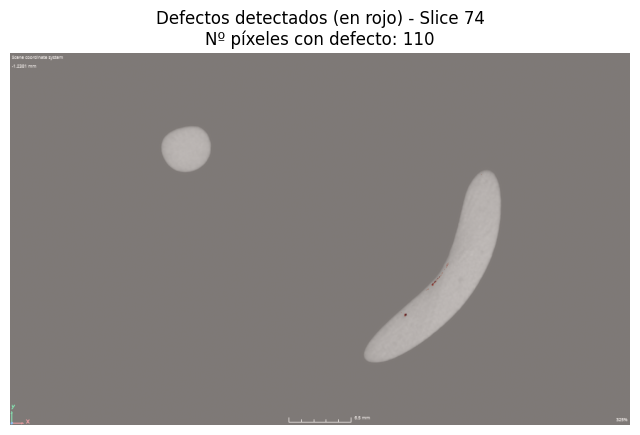

Slice 75: 64 píxeles con defecto


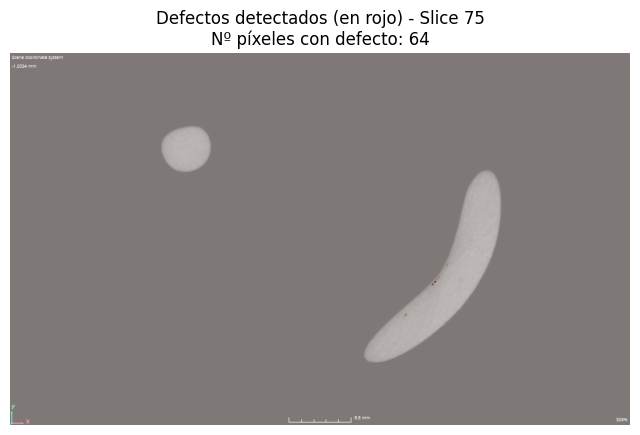

Slice 76: 104 píxeles con defecto


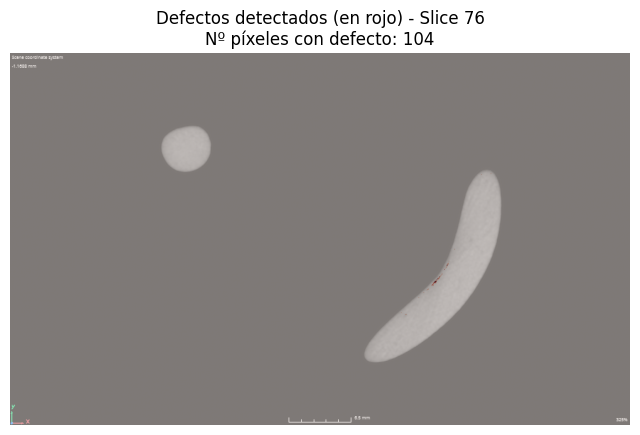

Slice 77: 34 píxeles con defecto


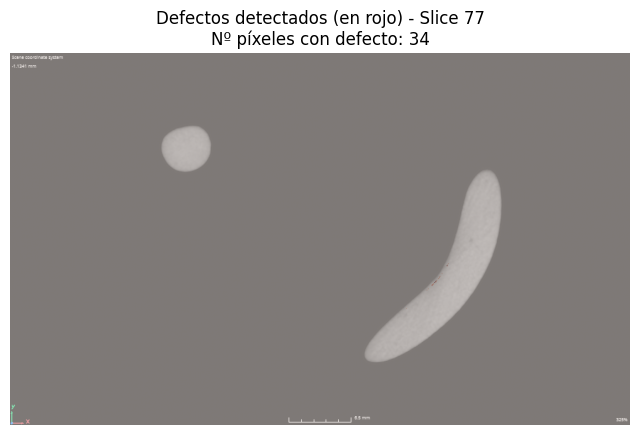

Slice 78: 62 píxeles con defecto


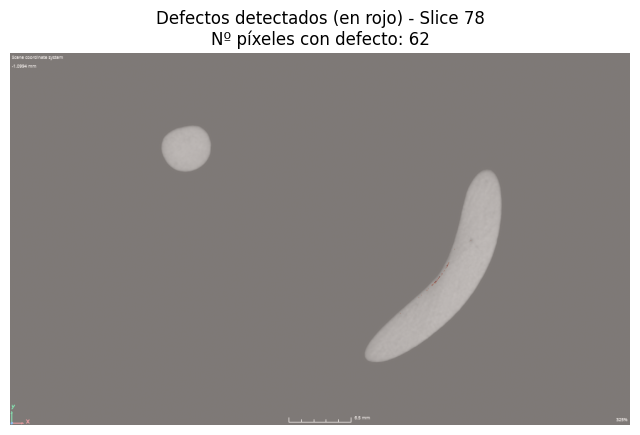

Slice 79: 38 píxeles con defecto


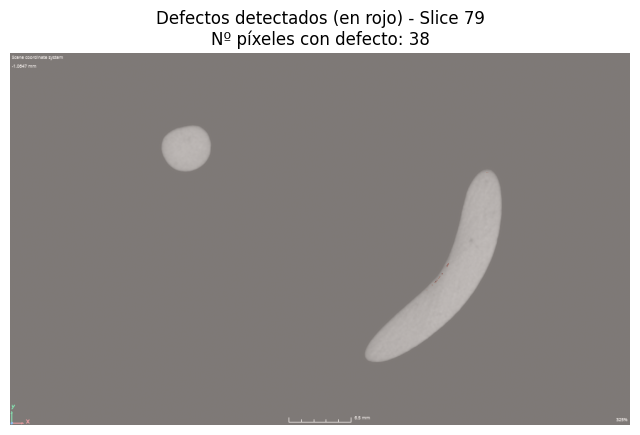

Slice 80: 61 píxeles con defecto


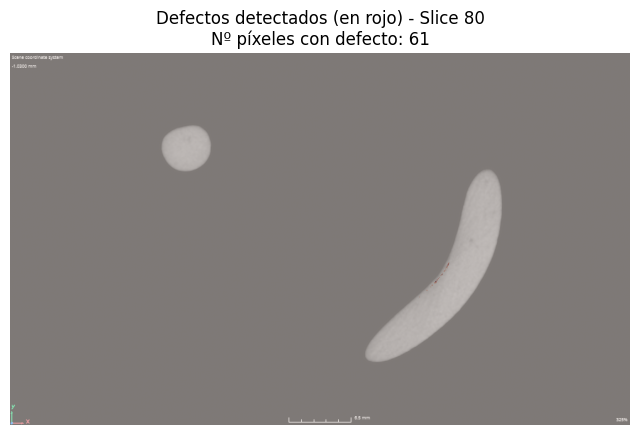

Slice 81: 45 píxeles con defecto


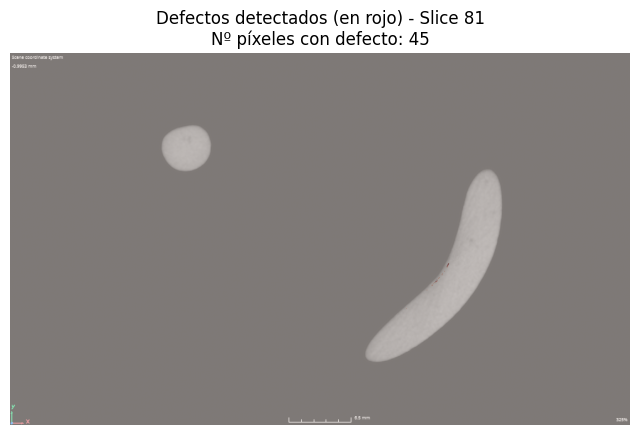

Slice 82: 75 píxeles con defecto


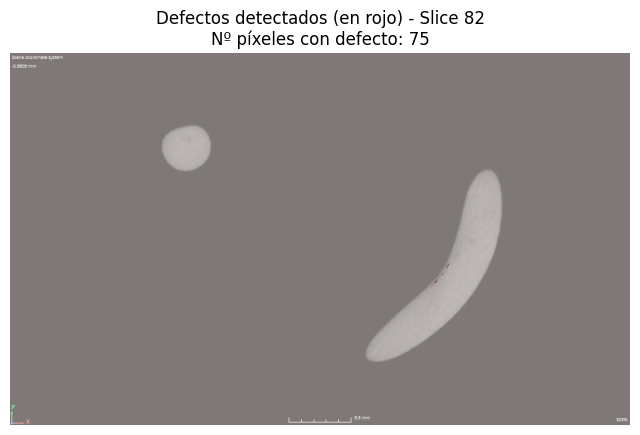

Slice 83: 66 píxeles con defecto


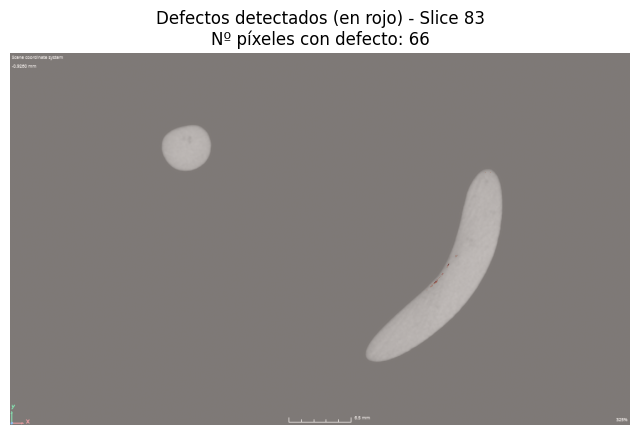

Slice 84: 130 píxeles con defecto


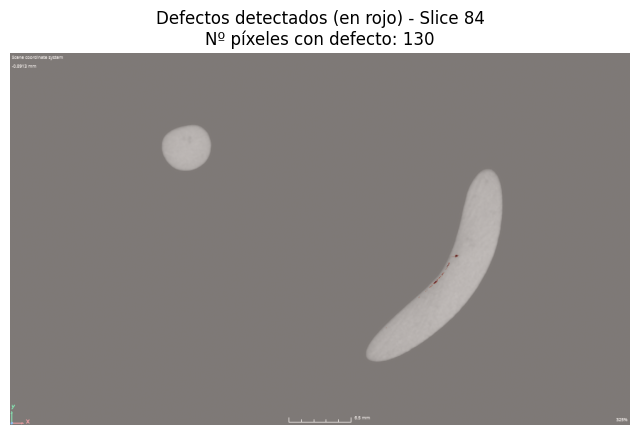

Slice 85: 75 píxeles con defecto


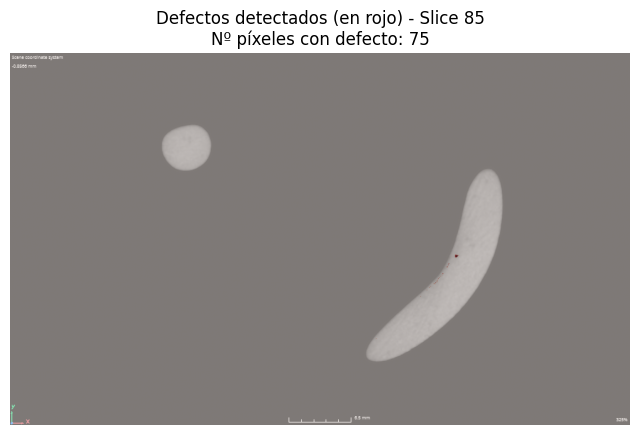

Slice 86: 98 píxeles con defecto


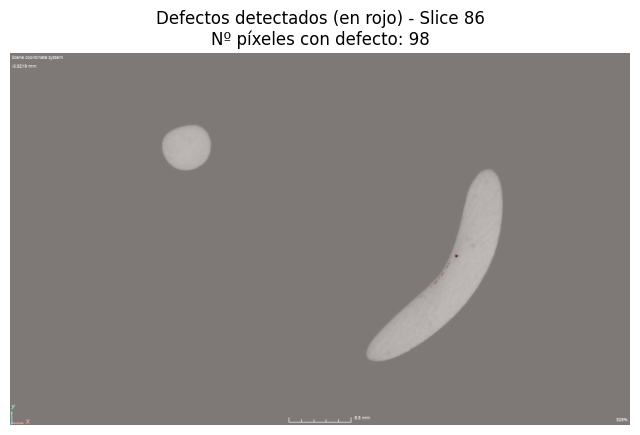

Slice 87: 51 píxeles con defecto


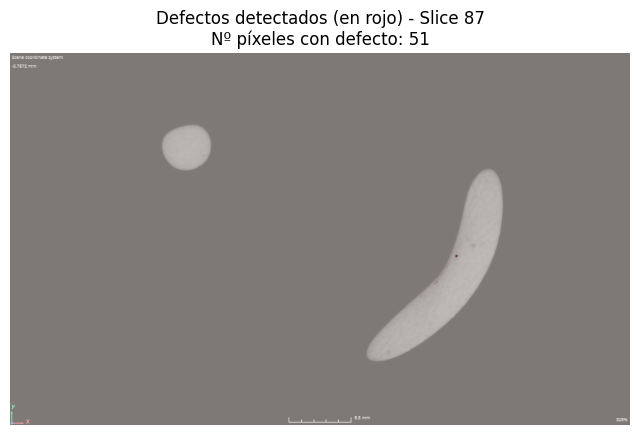

Slice 88: 100 píxeles con defecto


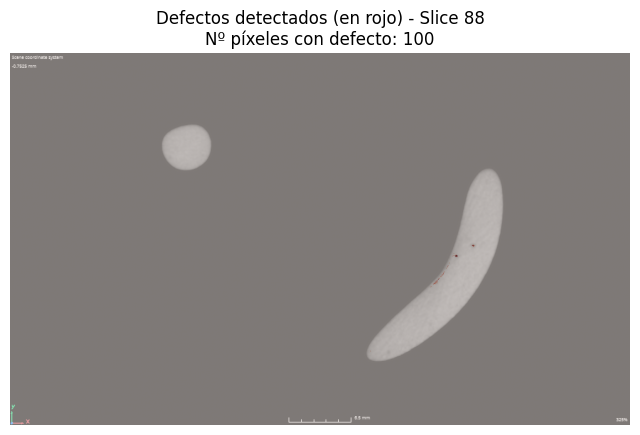

Slice 89: 87 píxeles con defecto


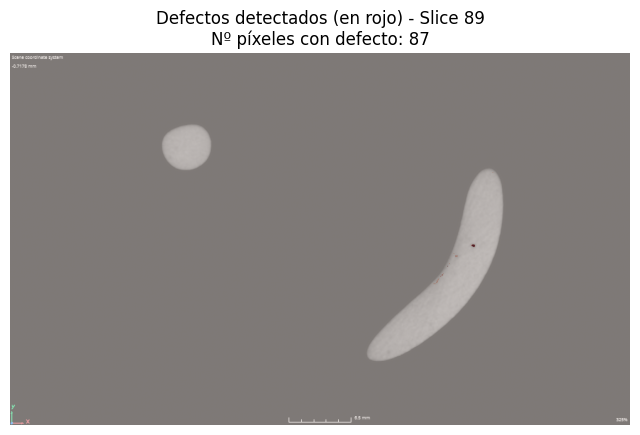

Slice 90: 121 píxeles con defecto


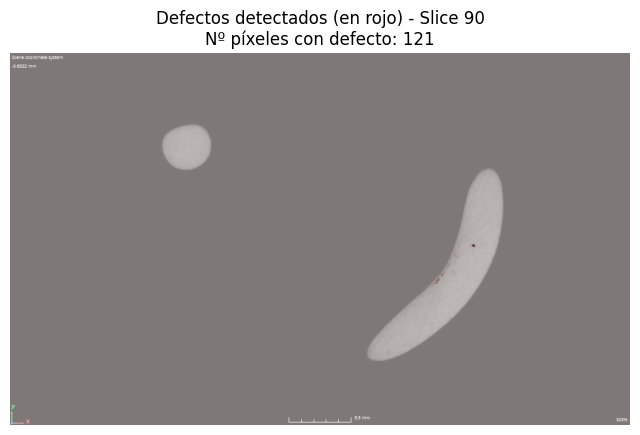

Slice 91: 64 píxeles con defecto


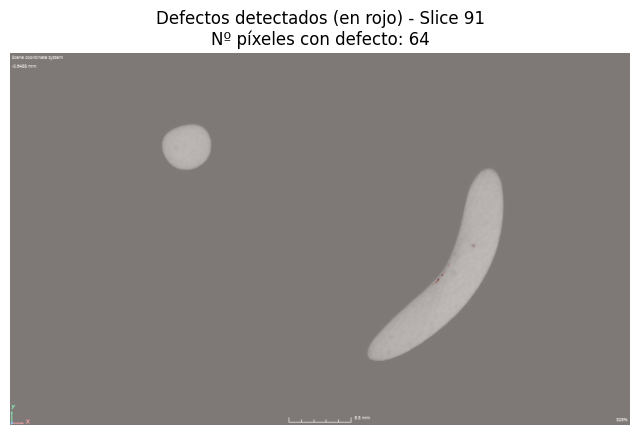

Slice 92: 91 píxeles con defecto


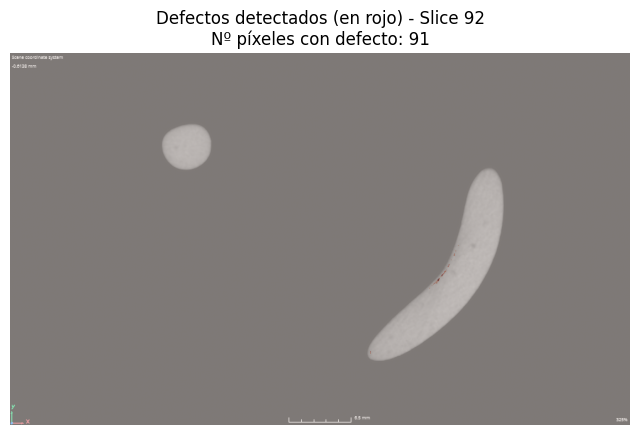

Slice 93: 60 píxeles con defecto


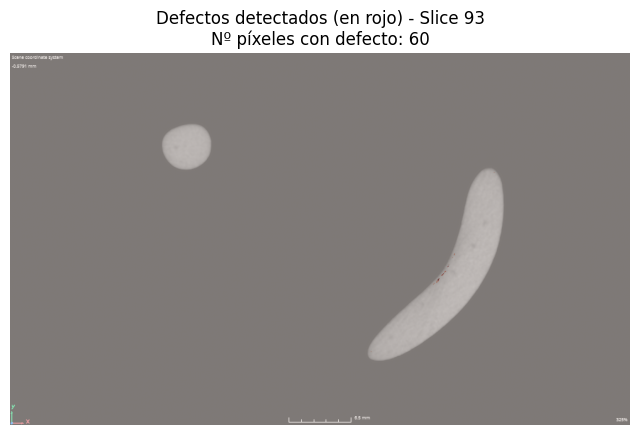

Slice 94: 93 píxeles con defecto


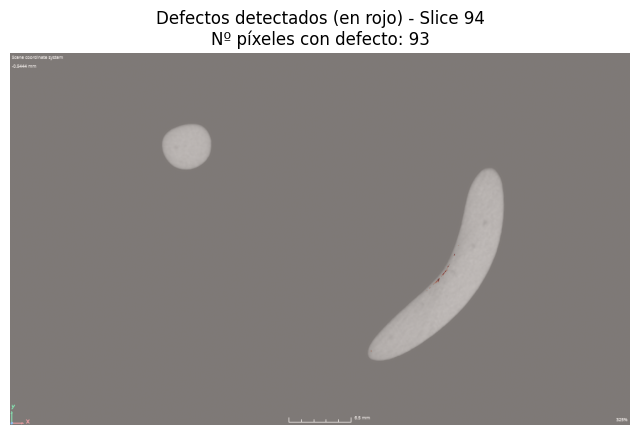

Slice 95: 106 píxeles con defecto


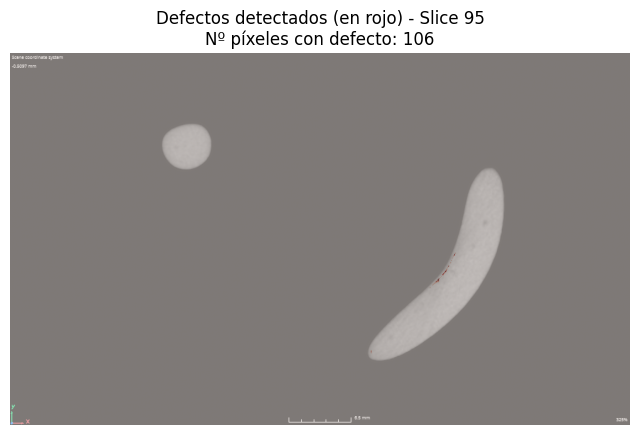

In [ ]:
import numpy as np
from scipy.ndimage import binary_erosion
import matplotlib.pyplot as plt

# --- Parámetros ---
umbral = 0.2         # Umbralde error para considerar un píxel como defecto
umbral_pieza = 0.2     # Umbral para los píxeles de la pieza
iterations = 5         # Iteraciones de erosión para eliminar borde

# --- Máscara de defecto ---
mascara_defecto = (error_map > umbral).float()

# --- Máscara de la pieza y erosión ---
mask_pieza = (input_def.cpu().sum(dim=1, keepdim=True) > umbral_pieza).float()
mask_np = mask_pieza.numpy().astype(bool)
mask_eroded = np.zeros_like(mask_np)
for b in range(mask_np.shape[0]):
    for d in range(mask_np.shape[2]):
        mask_eroded[b, 0, d] = binary_erosion(mask_np[b, 0, d], iterations=iterations)
mask_eroded = torch.tensor(mask_eroded, dtype=torch.float32)

# --- Defectos solo en el interior ---
mascara_defecto_interior = mascara_defecto * mask_eroded
num_defectos_interior = mascara_defecto_interior.sum().item()
print(f"Número de píxeles con defecto (solo interior de la pieza): {num_defectos_interior}")

# --- Visualización slice a slice ---
for depth in range(mascara_defecto_interior.shape[2]):
    real_img = input_def.cpu()[0, :, depth].permute(1, 2, 0).numpy()
    defectos_slice = mascara_defecto_interior[0, :, depth].sum(dim=0).cpu()
    num_defectos_slice = defectos_slice.sum().item()
    print(f"Slice {depth}: {int(num_defectos_slice)} píxeles con defecto")
    plt.figure(figsize=(8, 8))
    plt.imshow(real_img, cmap='gray')
    plt.imshow(defectos_slice, cmap='Reds', alpha=0.5)
    plt.title(f"Defectos detectados (en rojo) - Slice {depth}\nNº píxeles con defecto: {int(num_defectos_slice)}")
    plt.axis('off')
    plt.show()

Lo de abajo creo que es innecesario, vamos a descubrirlo

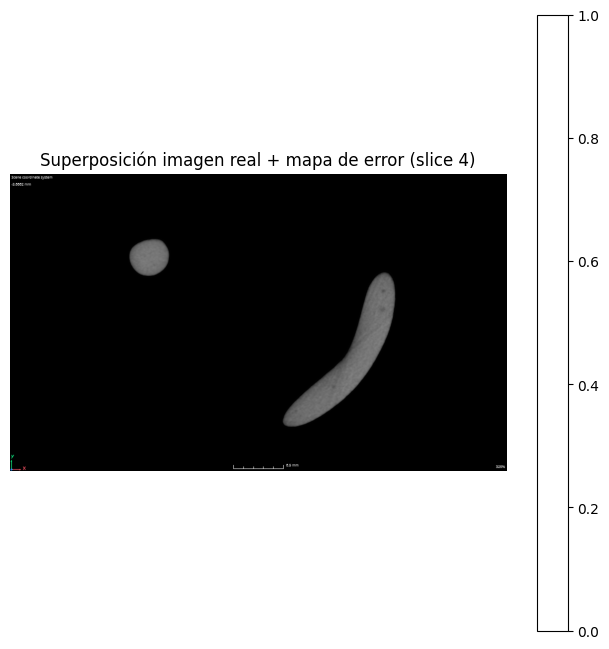

Número total de píxeles con defecto: 4750769.0
Número de píxeles con defecto en el slice 4: 108756.0


In [13]:
# Elige la imagen (las primeras del nudo_1 son las que mejor se aprecian los defectos)
depth = 4  

# Imagen real (normalizada a [0,1])
real_img = input_def.cpu()[0, :, depth].permute(1, 2, 0).numpy()

# Mapa de error (normalizado para visualizar bien)
err_map = error_map[0, :, depth].permute(1, 2, 0).numpy()
err_map_norm = (err_map - err_map.min()) / (err_map.max() - err_map.min() + 1e-8)  # Normaliza a [0,1]

plt.figure(figsize=(8, 8))
plt.imshow(real_img, cmap='cool')
plt.imshow(err_map_norm, cmap='viridis', alpha=0)  # alpha controla la transparencia
plt.title(f"Superposición imagen real + mapa de error (slice {depth})")
plt.axis('off')
plt.colorbar()
plt.show()



umbral = 0.27  # Valor del umbral para detectar defectos

# Crea una máscara de defectos (1 si error > umbral, 0 si no)
mascara_defecto = (error_map > umbral).float()

# Cuenta el número de píxeles con defecto en todo el volumen
num_defectos = mascara_defecto.sum().item()
print(f"Número total de píxeles con defecto: {num_defectos}")


num_defectos_slice = mascara_defecto[0, :, depth].sum().item()
print(f"Número de píxeles con defecto en el slice {depth}: {num_defectos_slice}")

Número de píxeles con defecto (solo interior de la pieza): 18232.0
Slice 0: 701 píxeles con defecto


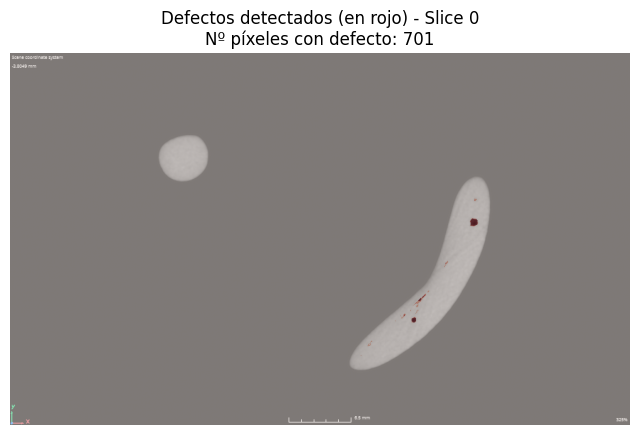

Slice 1: 597 píxeles con defecto


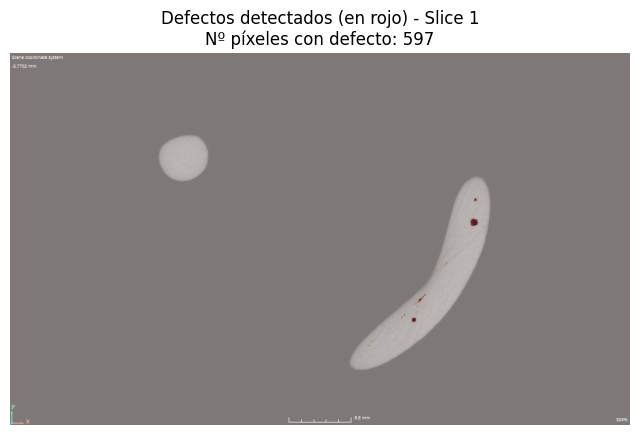

Slice 2: 560 píxeles con defecto


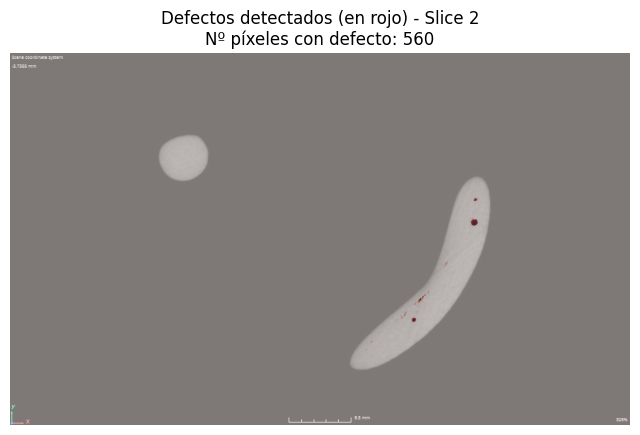

Slice 3: 342 píxeles con defecto


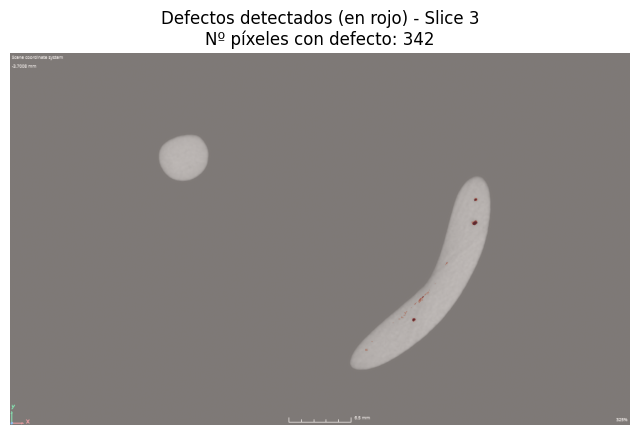

Slice 4: 308 píxeles con defecto


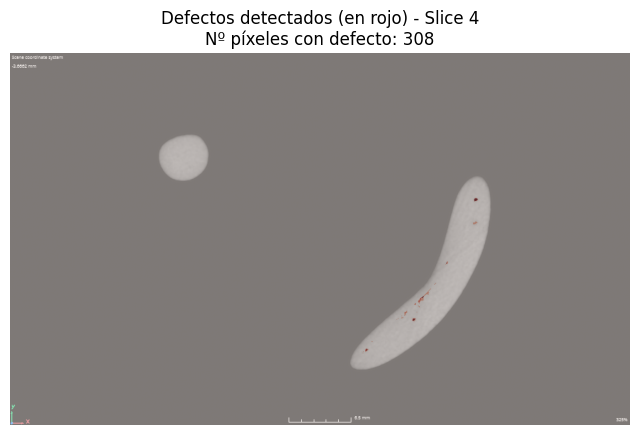

Slice 5: 205 píxeles con defecto


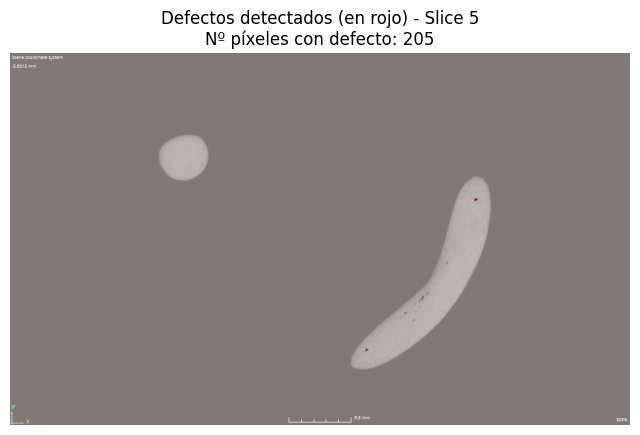

Slice 6: 263 píxeles con defecto


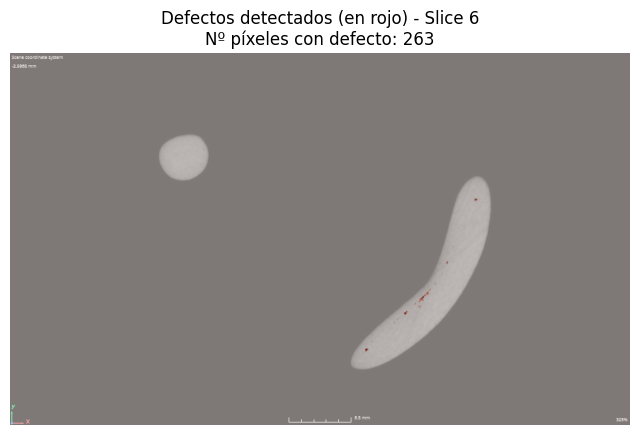

Slice 7: 206 píxeles con defecto


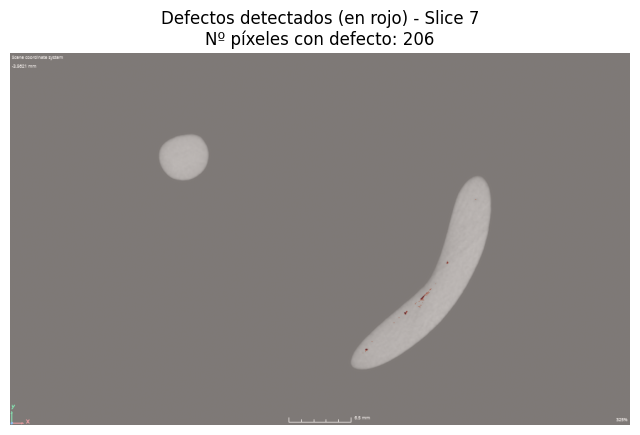

Slice 8: 292 píxeles con defecto


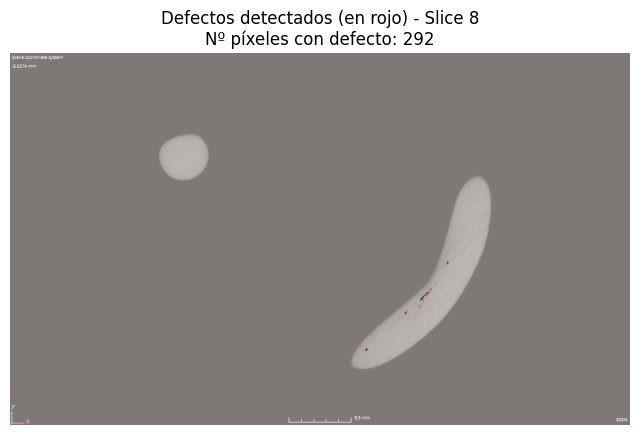

Slice 9: 216 píxeles con defecto


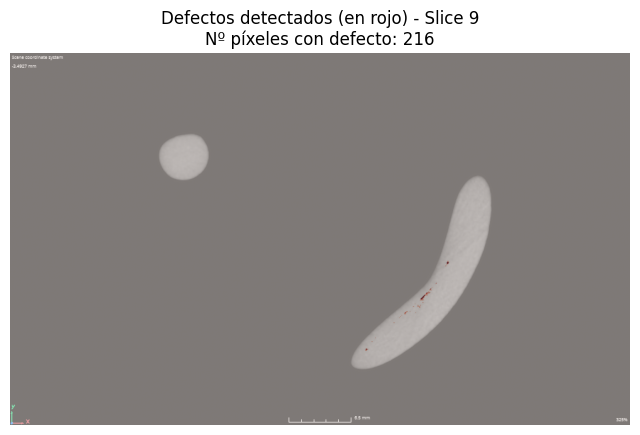

Slice 10: 269 píxeles con defecto


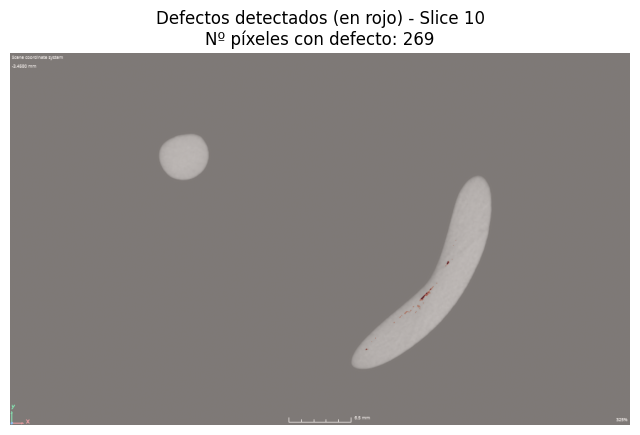

Slice 11: 170 píxeles con defecto


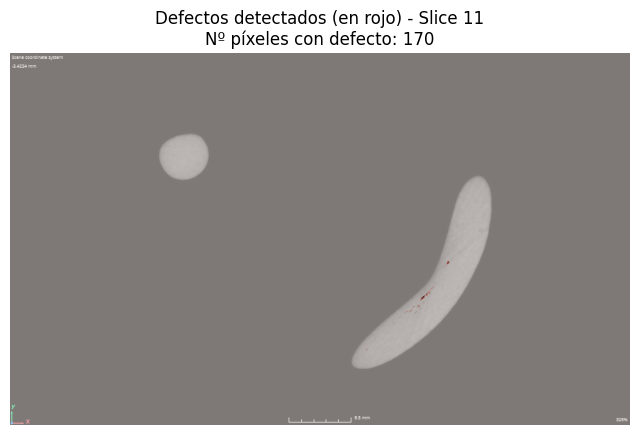

Slice 12: 239 píxeles con defecto


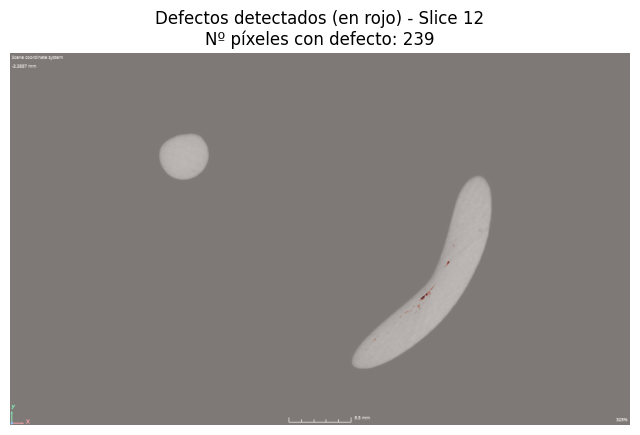

Slice 13: 145 píxeles con defecto


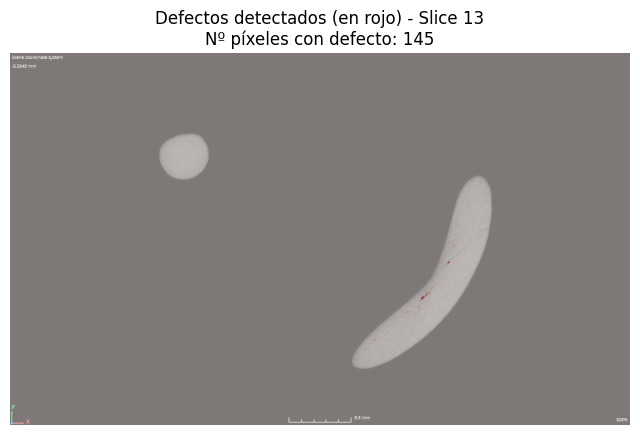

Slice 14: 193 píxeles con defecto


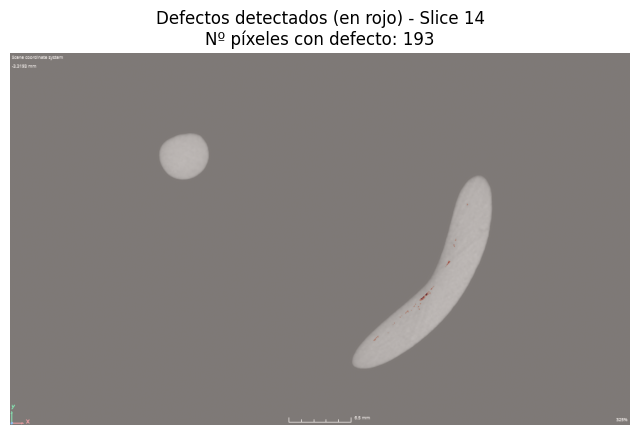

Slice 15: 125 píxeles con defecto


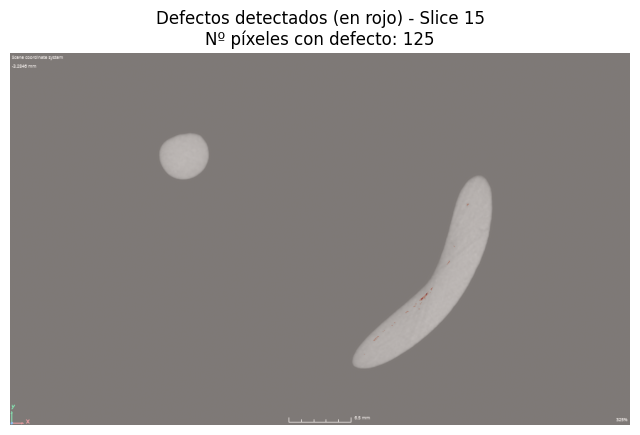

Slice 16: 187 píxeles con defecto


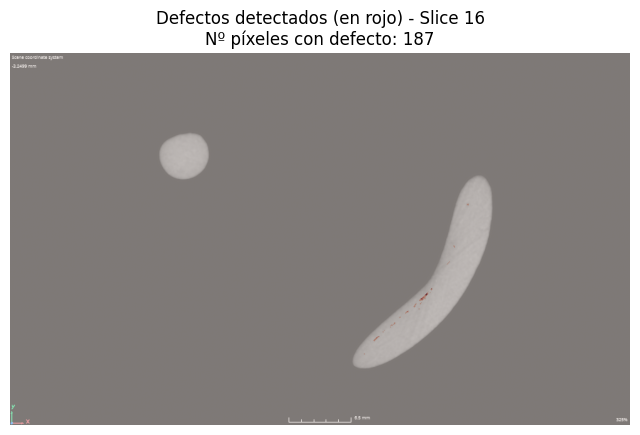

Slice 17: 135 píxeles con defecto


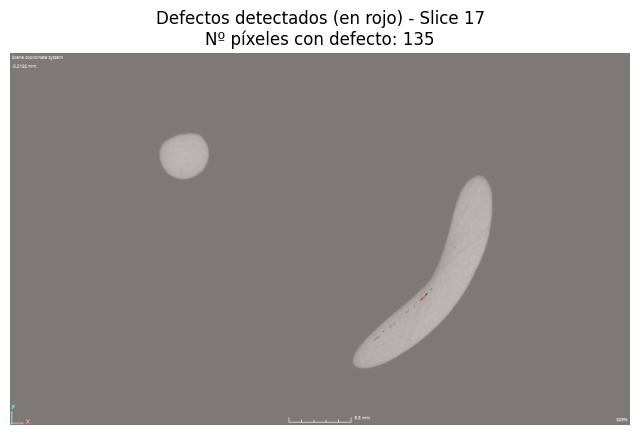

Slice 18: 235 píxeles con defecto


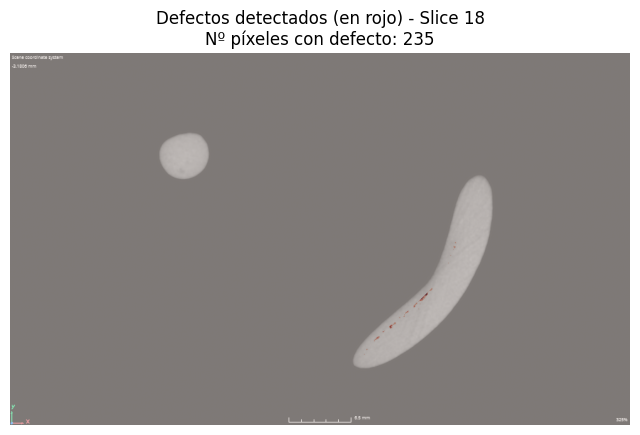

Slice 19: 206 píxeles con defecto


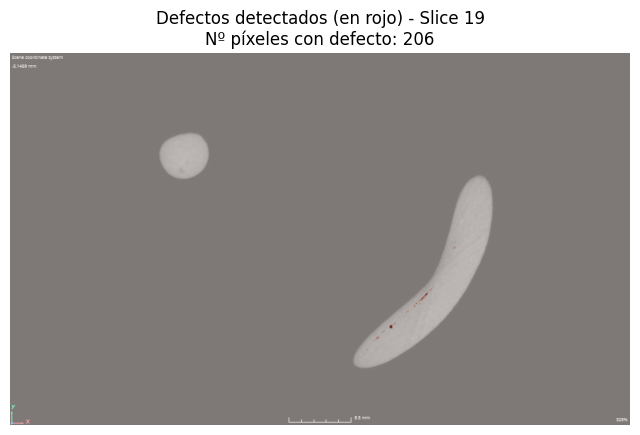

Slice 20: 299 píxeles con defecto


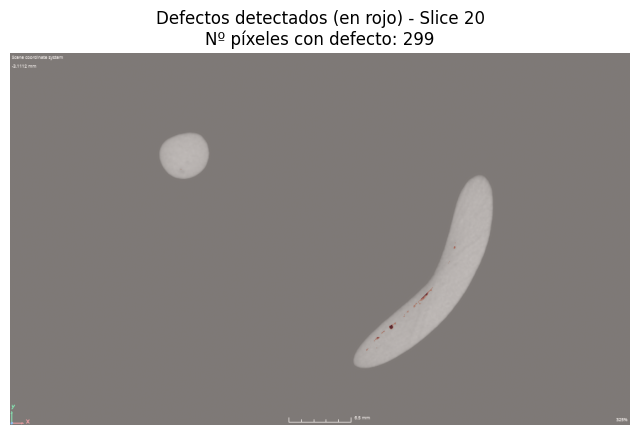

Slice 21: 252 píxeles con defecto


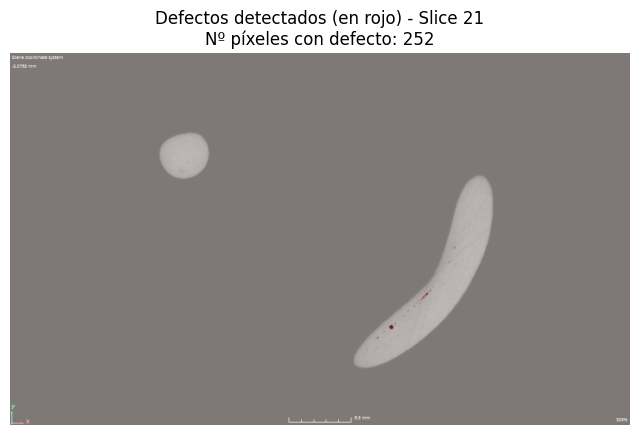

Slice 22: 316 píxeles con defecto


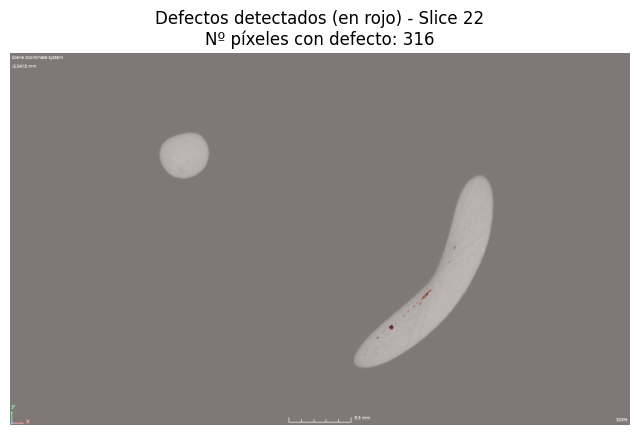

Slice 23: 268 píxeles con defecto


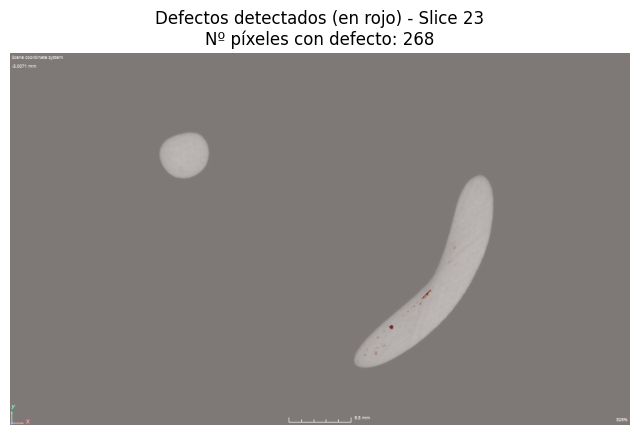

Slice 24: 331 píxeles con defecto


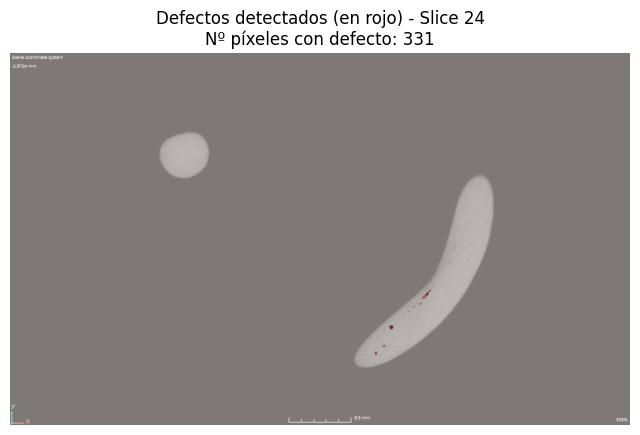

Slice 25: 200 píxeles con defecto


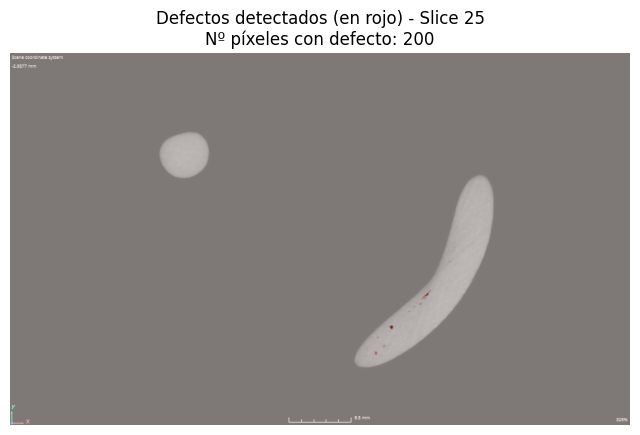

Slice 26: 221 píxeles con defecto


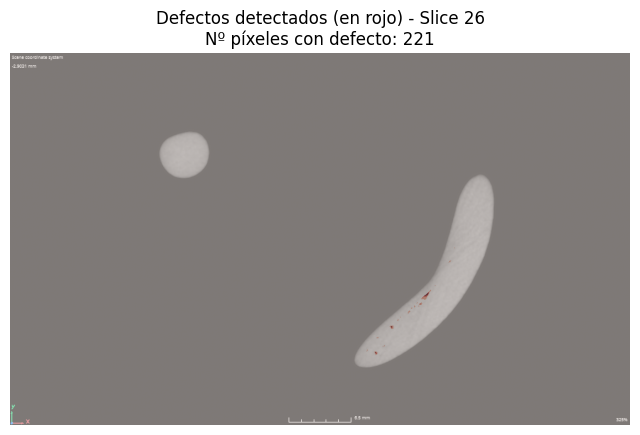

Slice 27: 127 píxeles con defecto


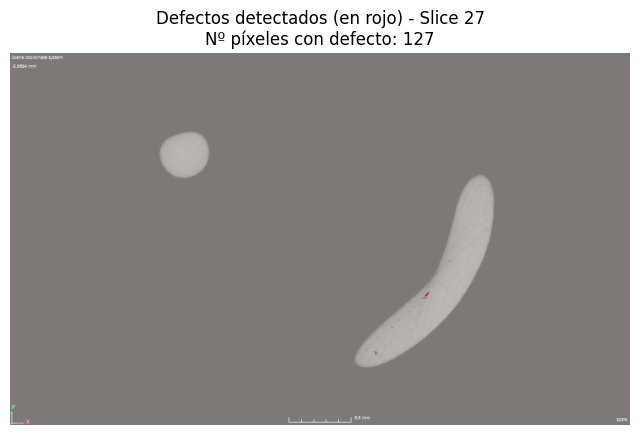

Slice 28: 172 píxeles con defecto


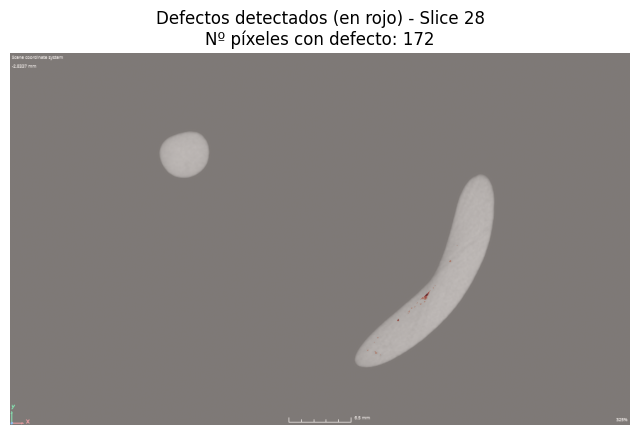

Slice 29: 123 píxeles con defecto


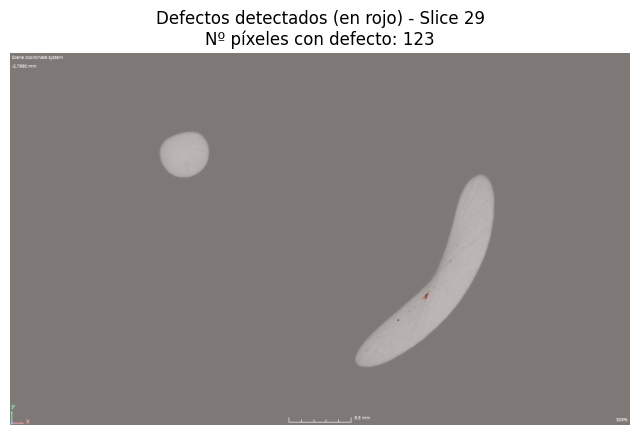

Slice 30: 162 píxeles con defecto


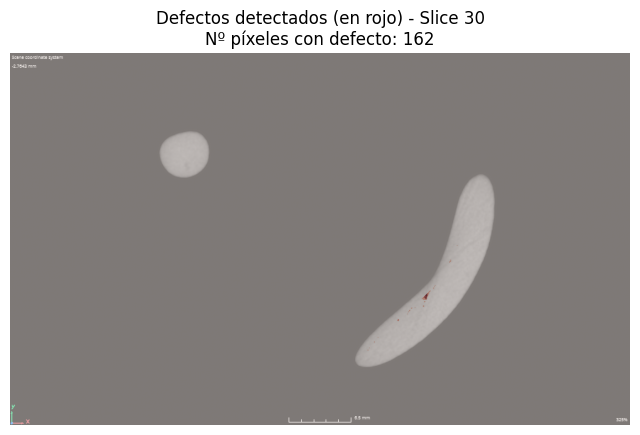

Slice 31: 117 píxeles con defecto


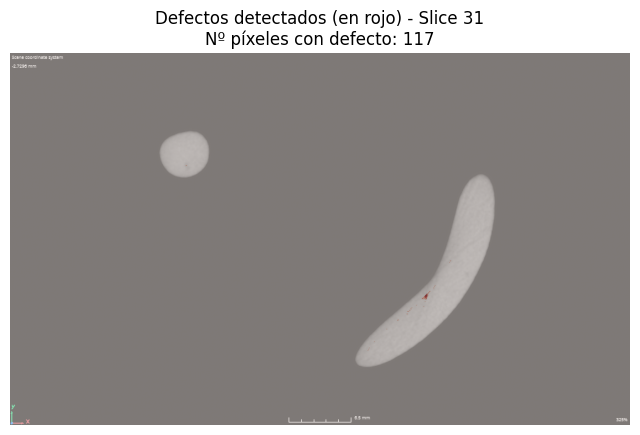

Slice 32: 164 píxeles con defecto


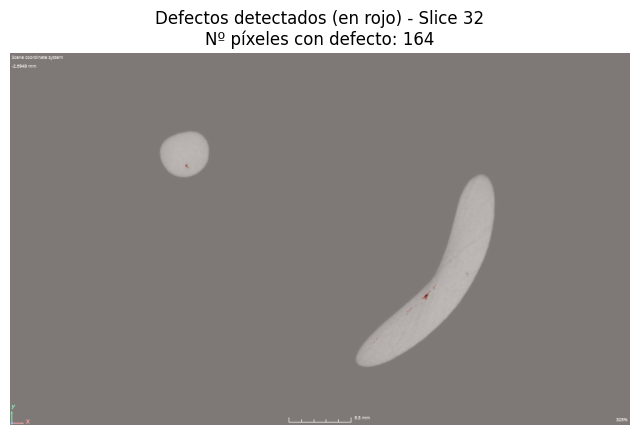

Slice 33: 133 píxeles con defecto


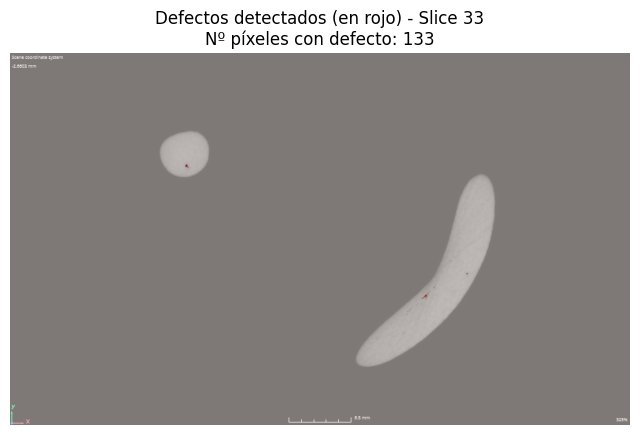

Slice 34: 201 píxeles con defecto


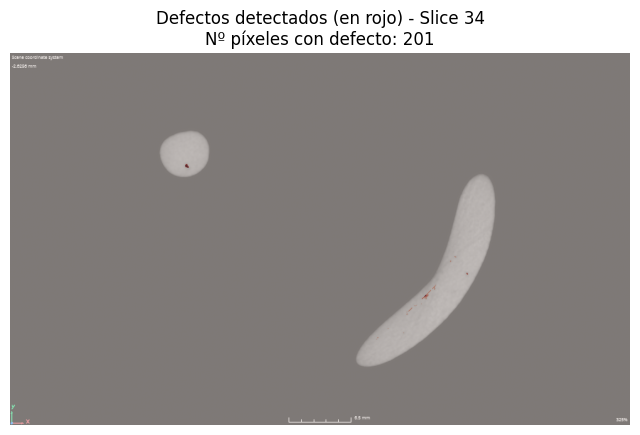

Slice 35: 128 píxeles con defecto


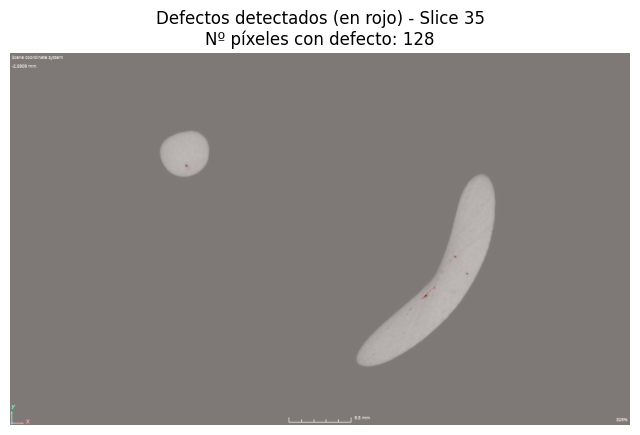

Slice 36: 181 píxeles con defecto


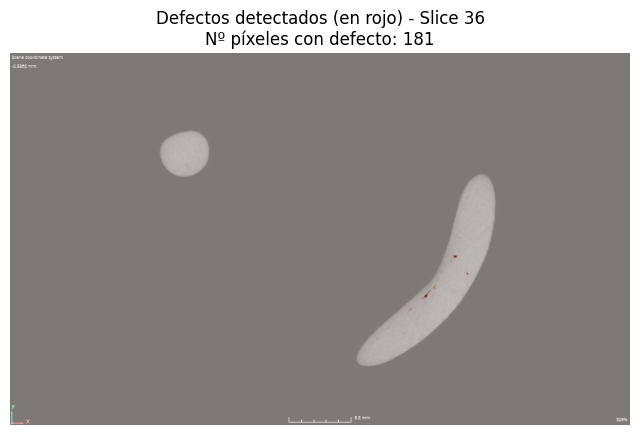

Slice 37: 133 píxeles con defecto


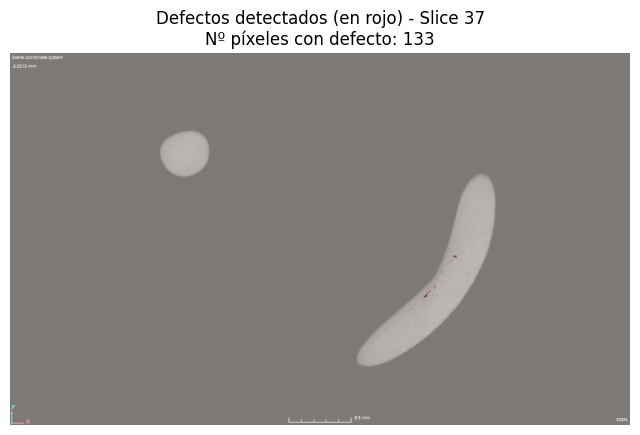

Slice 38: 179 píxeles con defecto


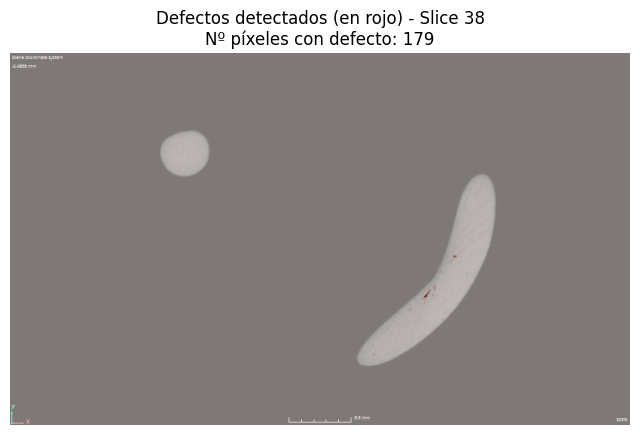

Slice 39: 131 píxeles con defecto


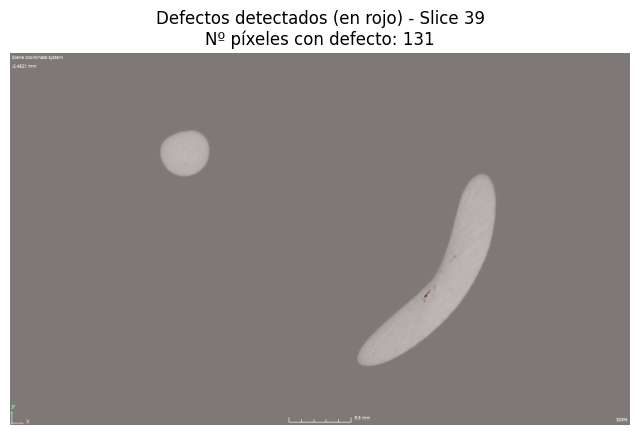

Slice 40: 152 píxeles con defecto


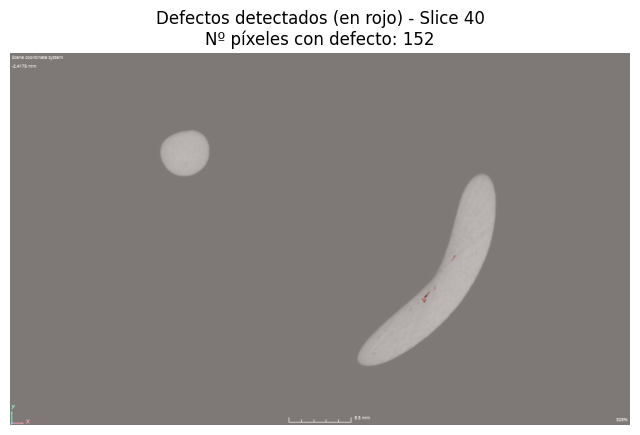

Slice 41: 127 píxeles con defecto


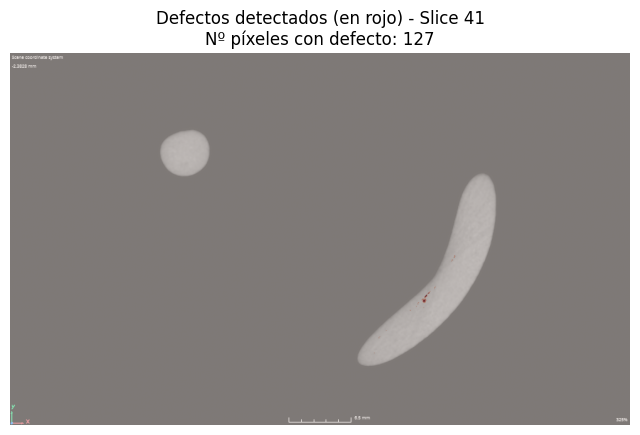

Slice 42: 186 píxeles con defecto


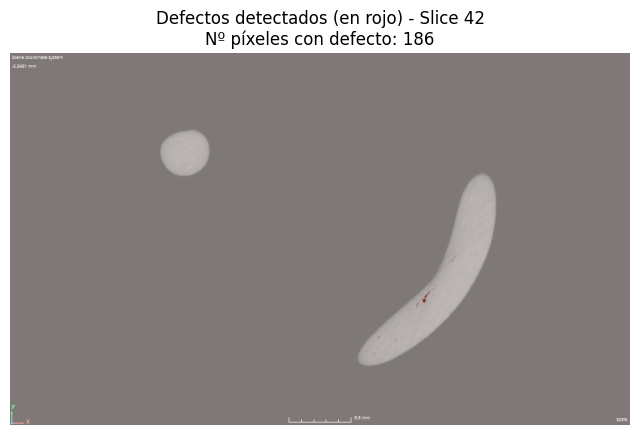

Slice 43: 166 píxeles con defecto


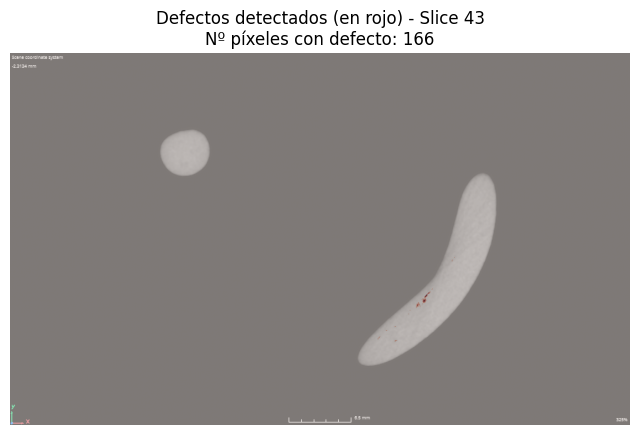

Slice 44: 261 píxeles con defecto


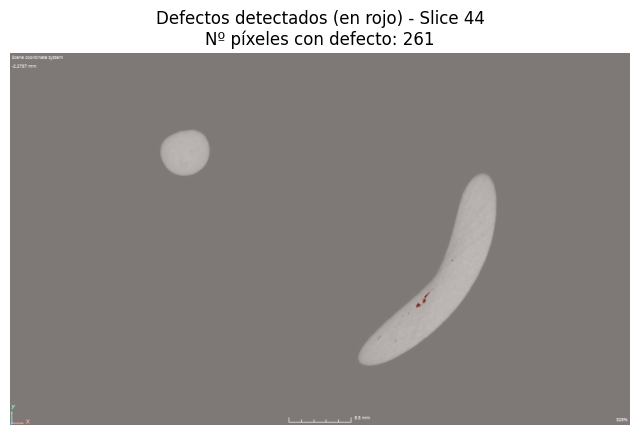

Slice 45: 246 píxeles con defecto


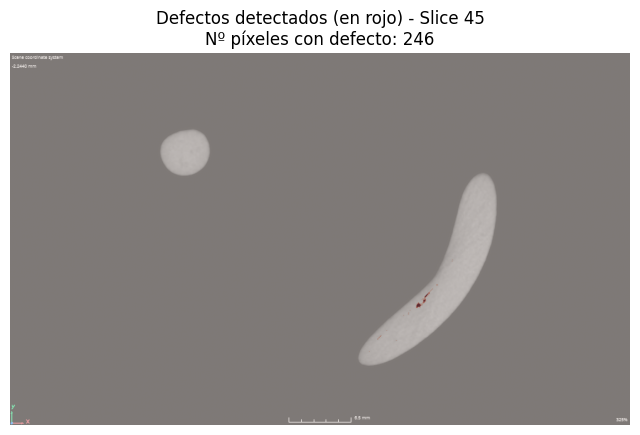

Slice 46: 262 píxeles con defecto


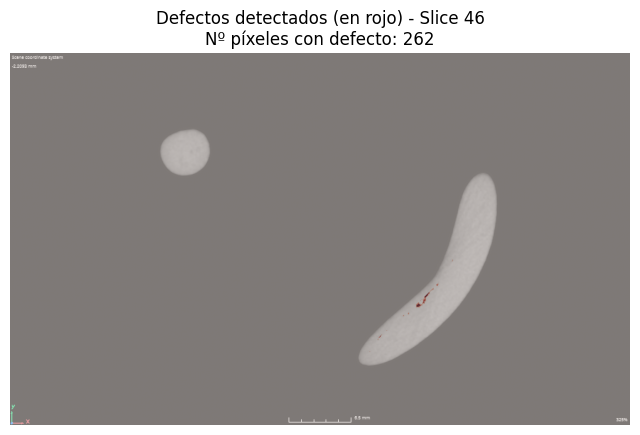

Slice 47: 141 píxeles con defecto


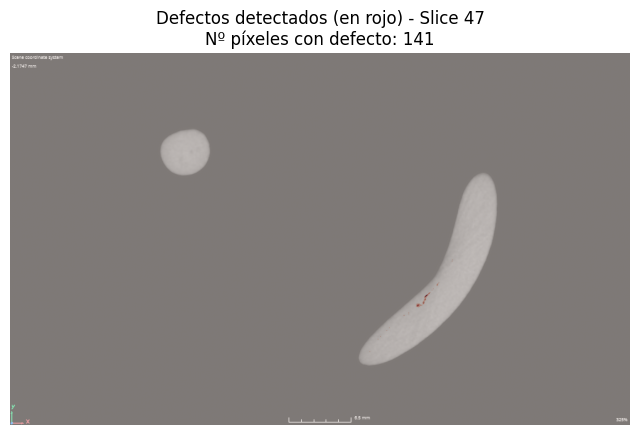

Slice 48: 171 píxeles con defecto


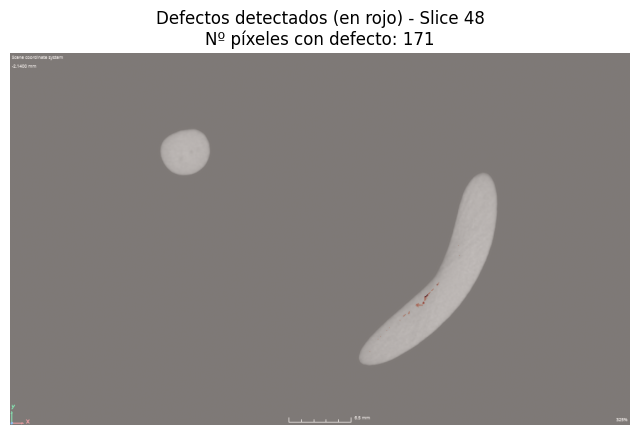

Slice 49: 101 píxeles con defecto


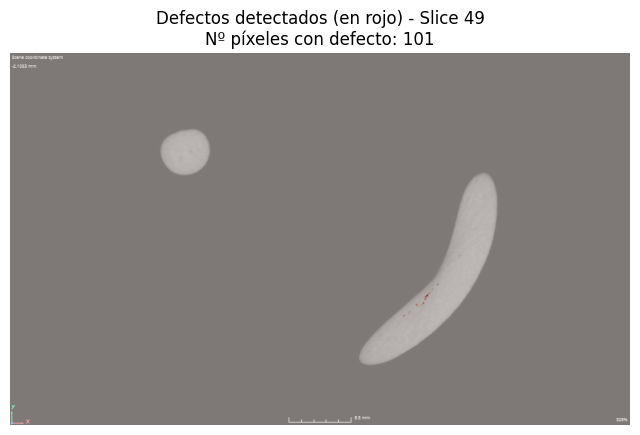

Slice 50: 130 píxeles con defecto


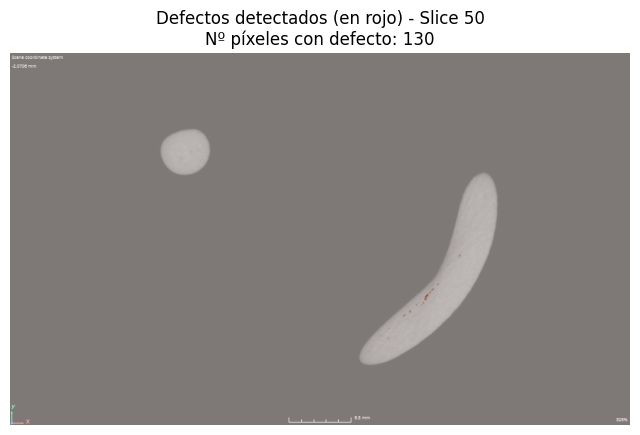

Slice 51: 98 píxeles con defecto


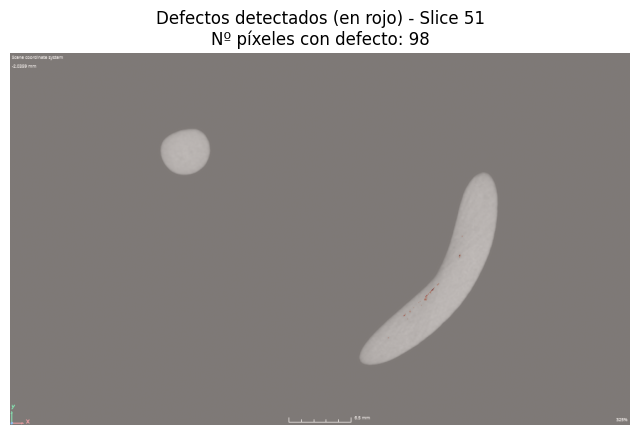

Slice 52: 147 píxeles con defecto


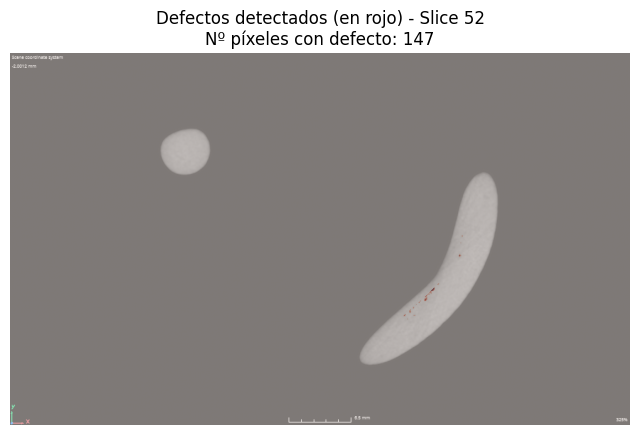

Slice 53: 105 píxeles con defecto


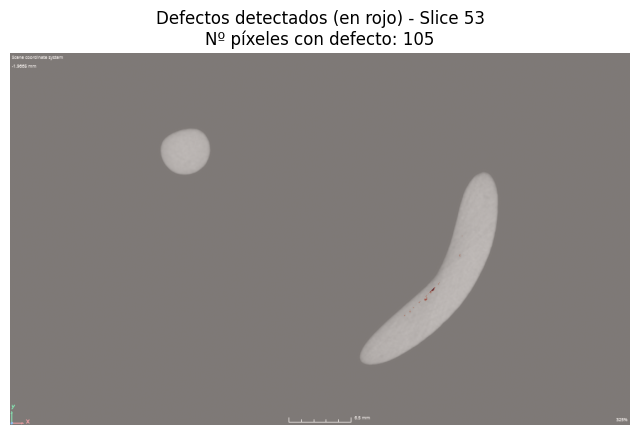

Slice 54: 136 píxeles con defecto


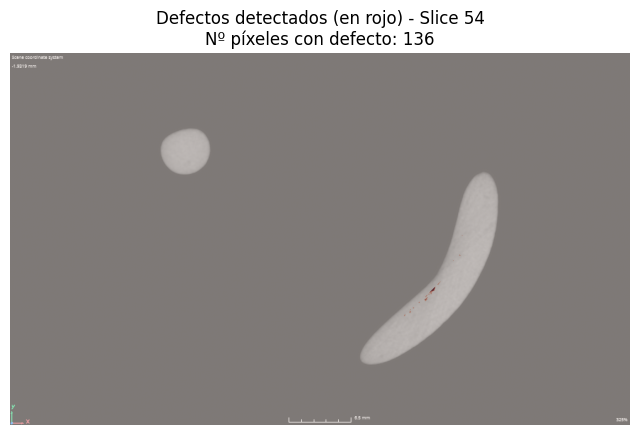

Slice 55: 106 píxeles con defecto


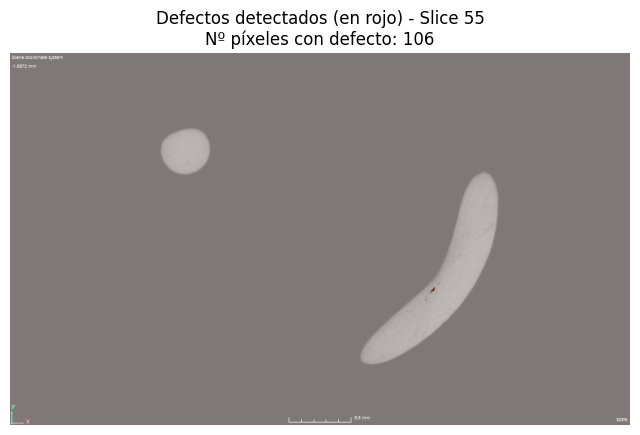

Slice 56: 175 píxeles con defecto


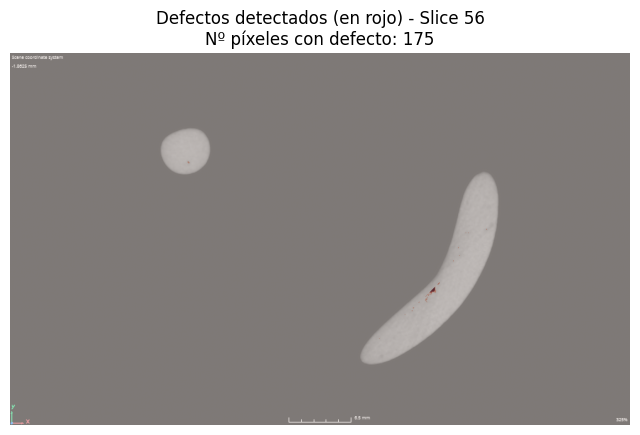

Slice 57: 171 píxeles con defecto


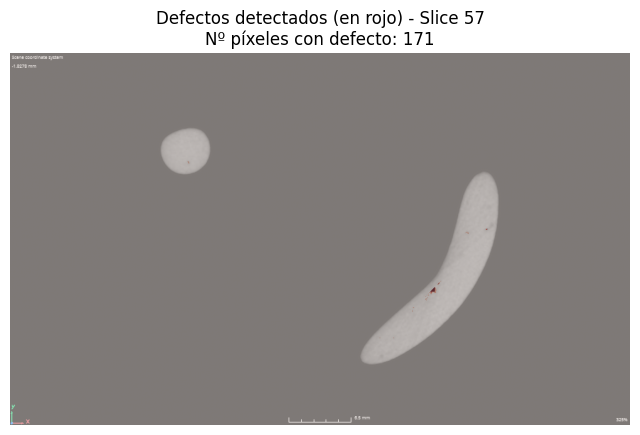

Slice 58: 204 píxeles con defecto


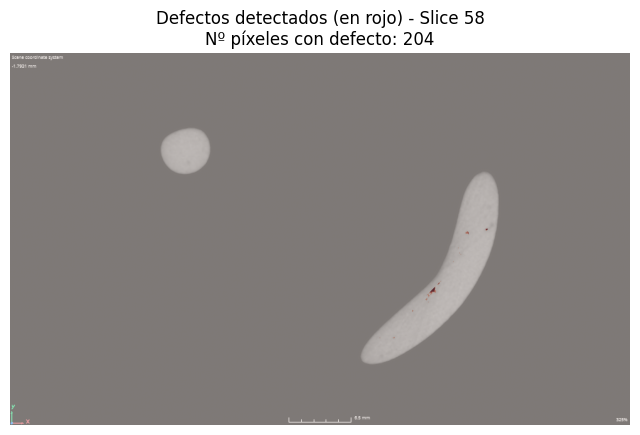

Slice 59: 148 píxeles con defecto


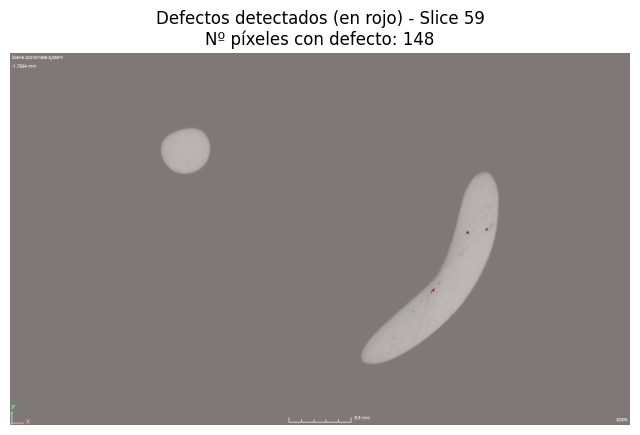

Slice 60: 168 píxeles con defecto


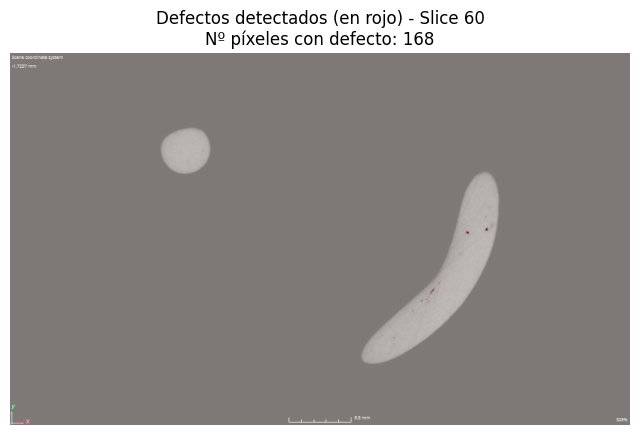

Slice 61: 96 píxeles con defecto


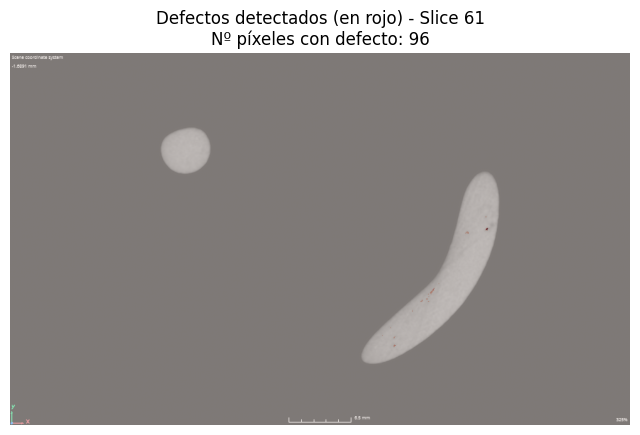

Slice 62: 132 píxeles con defecto


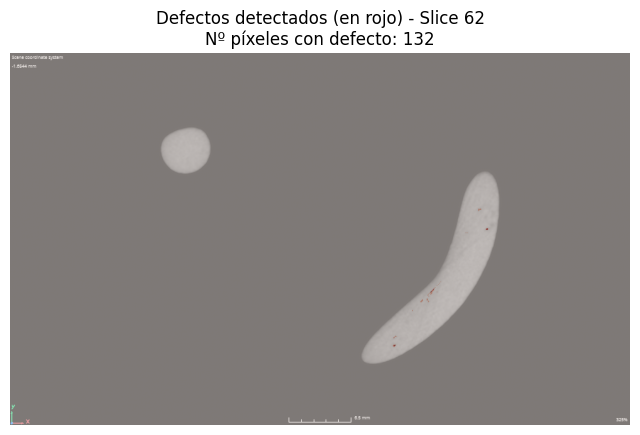

Slice 63: 130 píxeles con defecto


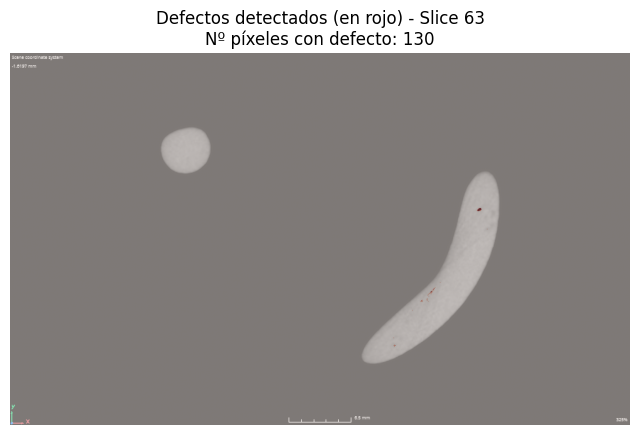

Slice 64: 202 píxeles con defecto


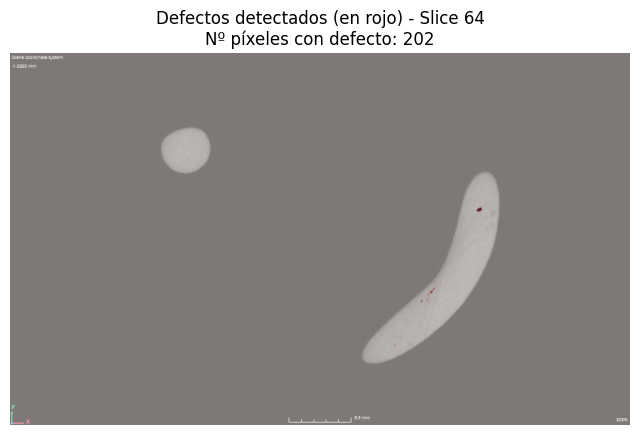

Slice 65: 184 píxeles con defecto


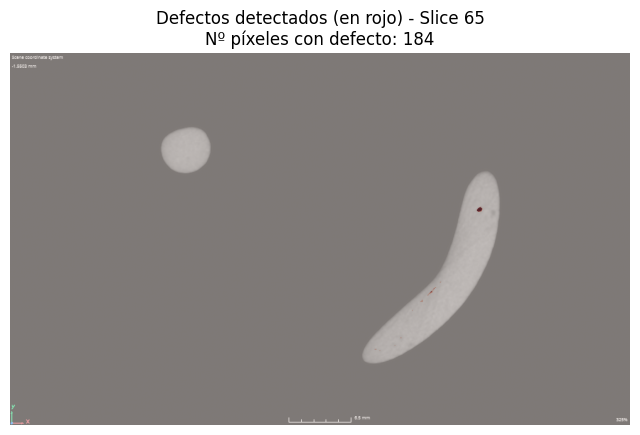

Slice 66: 251 píxeles con defecto


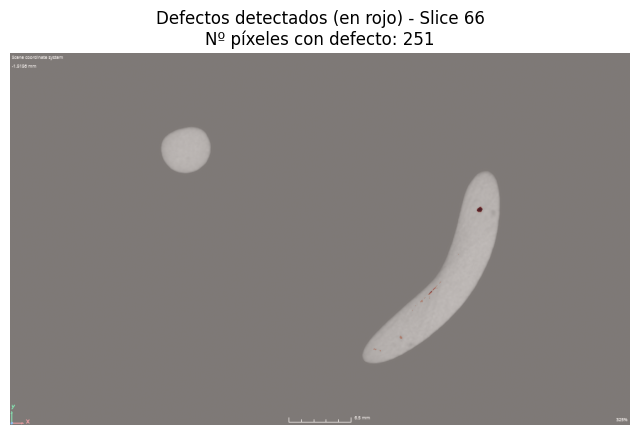

Slice 67: 242 píxeles con defecto


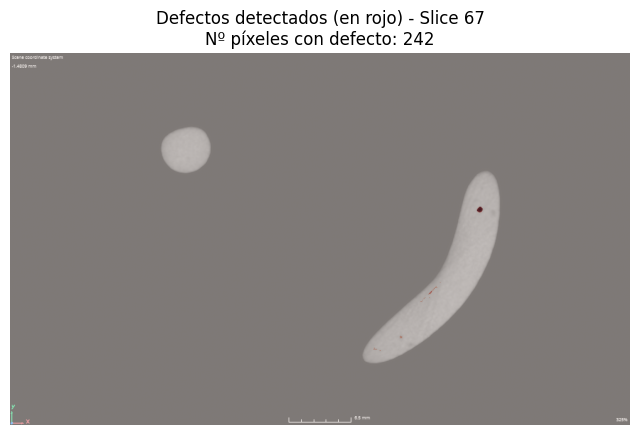

Slice 68: 312 píxeles con defecto


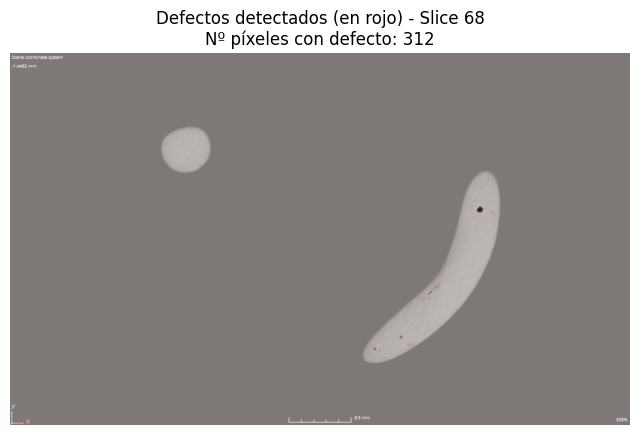

Slice 69: 237 píxeles con defecto


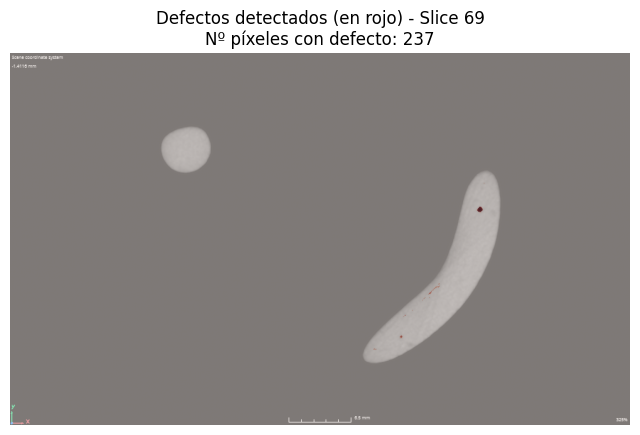

Slice 70: 211 píxeles con defecto


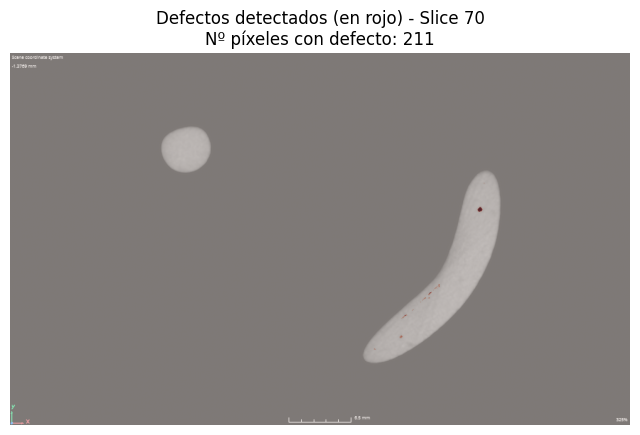

Slice 71: 129 píxeles con defecto


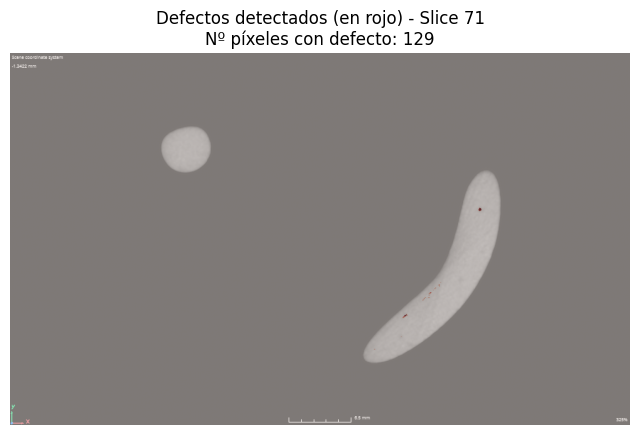

Slice 72: 130 píxeles con defecto


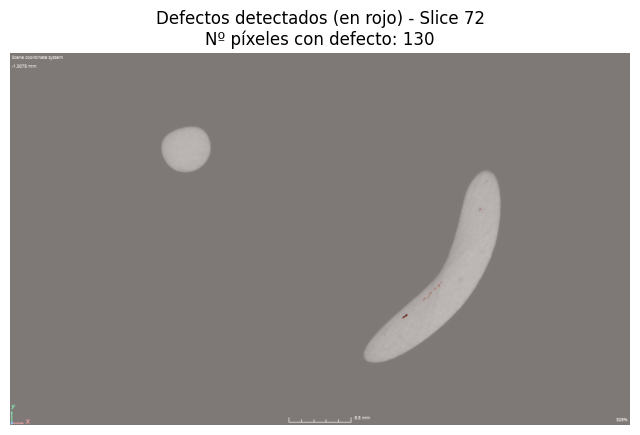

Slice 73: 112 píxeles con defecto


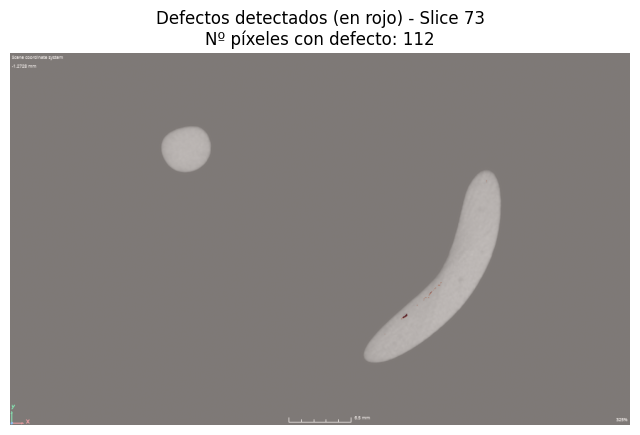

Slice 74: 141 píxeles con defecto


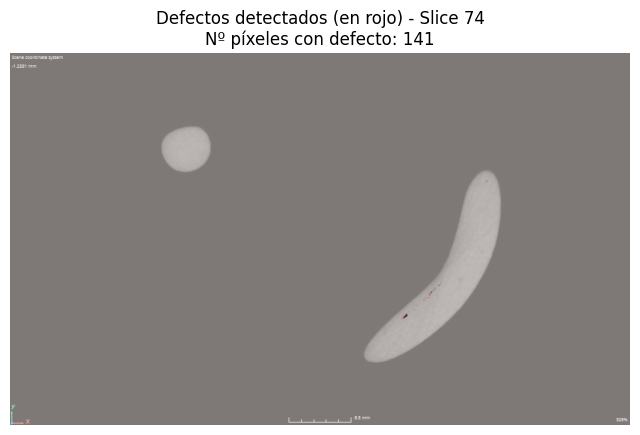

Slice 75: 104 píxeles con defecto


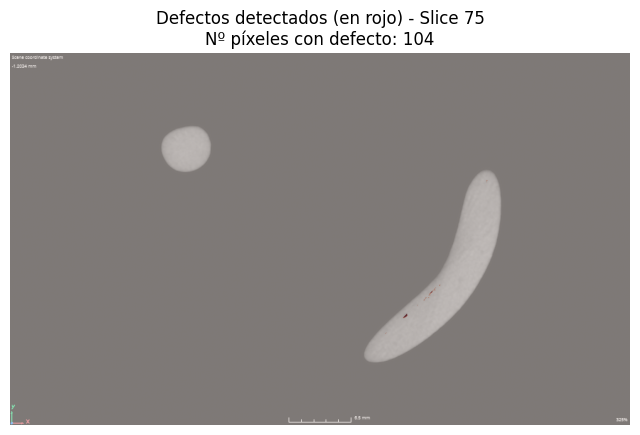

Slice 76: 125 píxeles con defecto


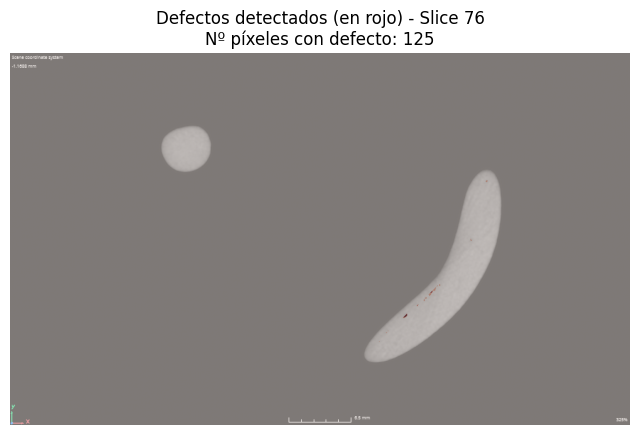

Slice 77: 104 píxeles con defecto


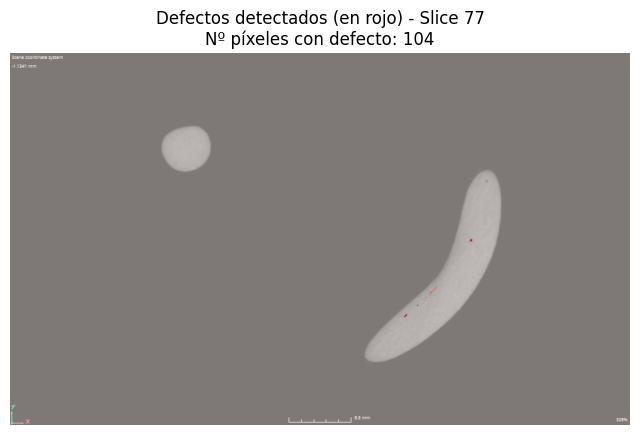

Slice 78: 156 píxeles con defecto


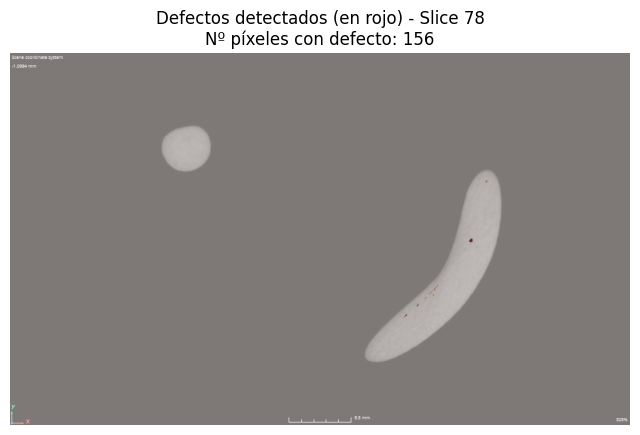

Slice 79: 108 píxeles con defecto


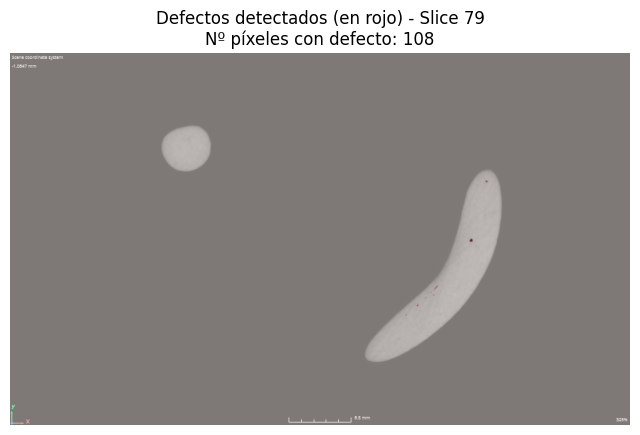

Slice 80: 136 píxeles con defecto


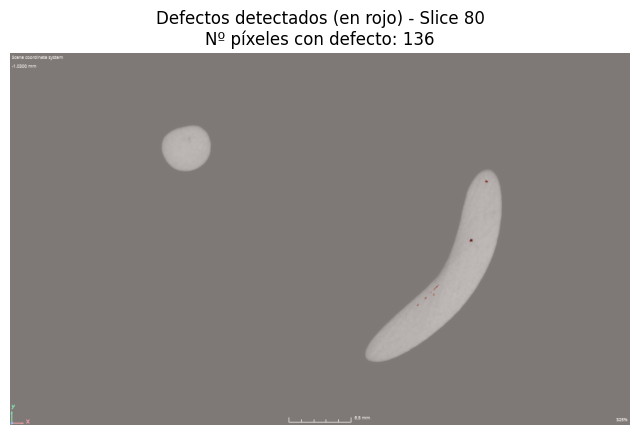

Slice 81: 94 píxeles con defecto


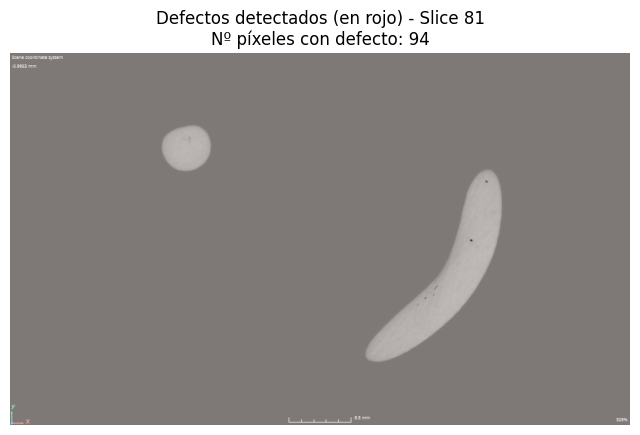

Slice 82: 117 píxeles con defecto


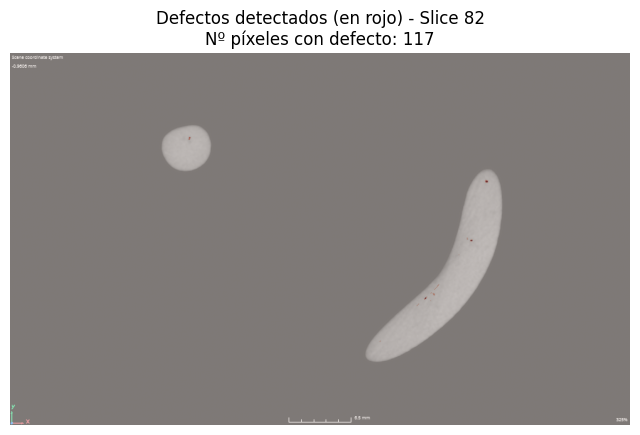

Slice 83: 101 píxeles con defecto


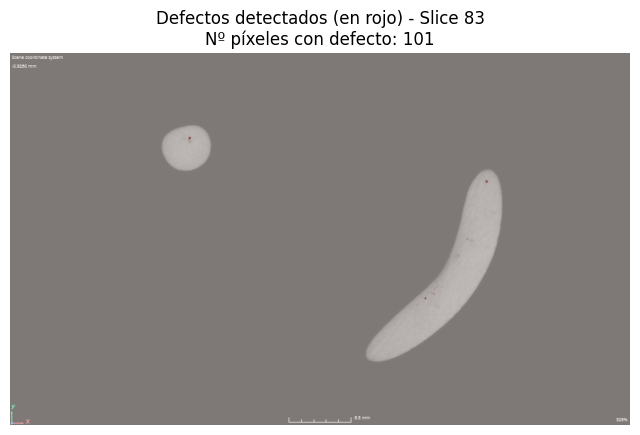

Slice 84: 101 píxeles con defecto


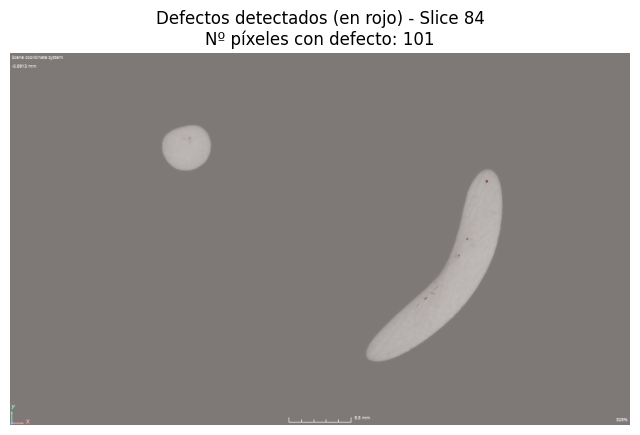

Slice 85: 74 píxeles con defecto


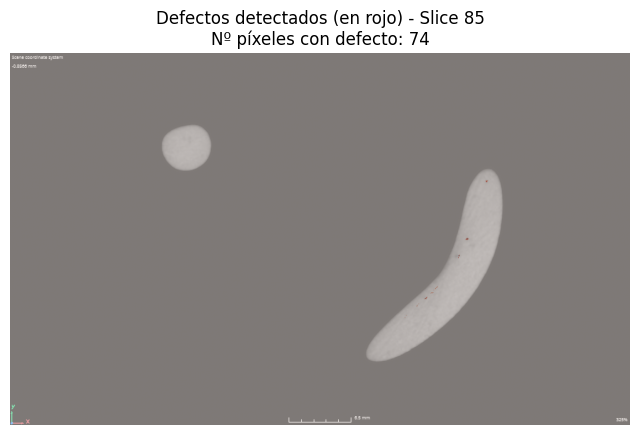

Slice 86: 129 píxeles con defecto


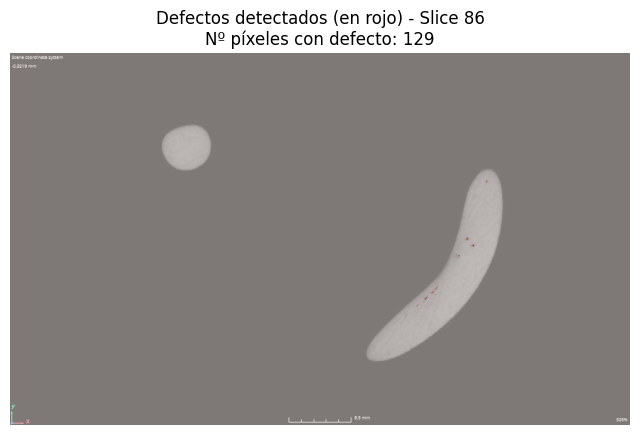

Slice 87: 114 píxeles con defecto


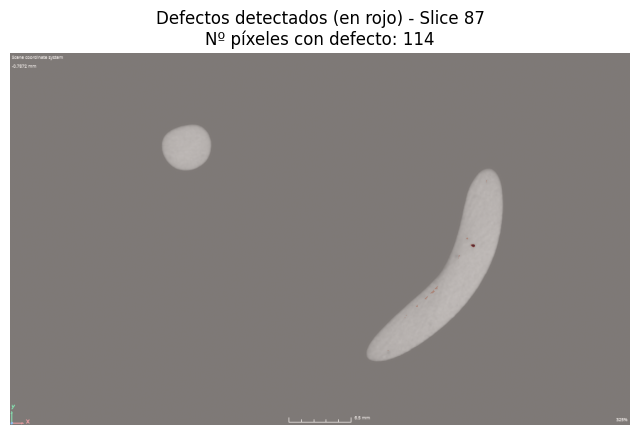

Slice 88: 163 píxeles con defecto


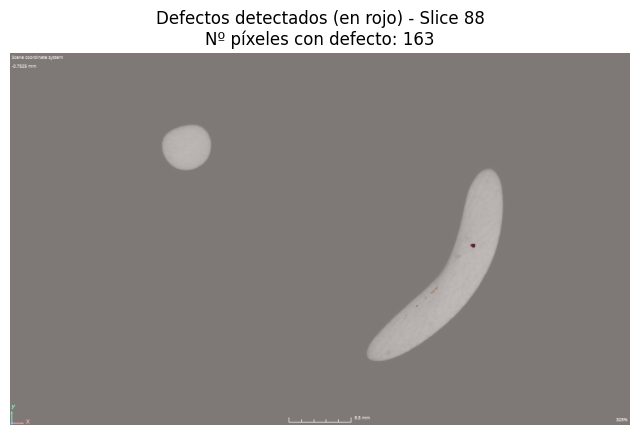

Slice 89: 161 píxeles con defecto


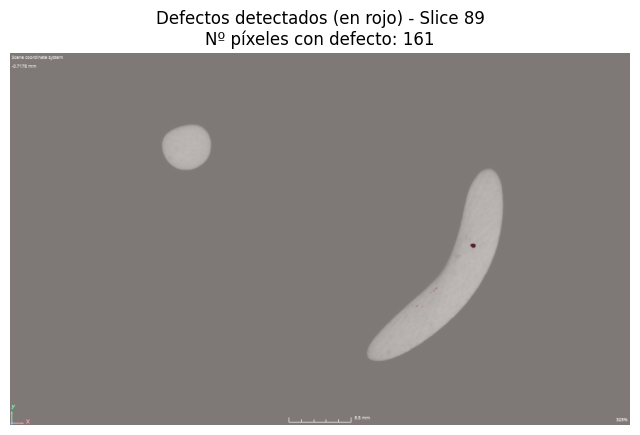

Slice 90: 173 píxeles con defecto


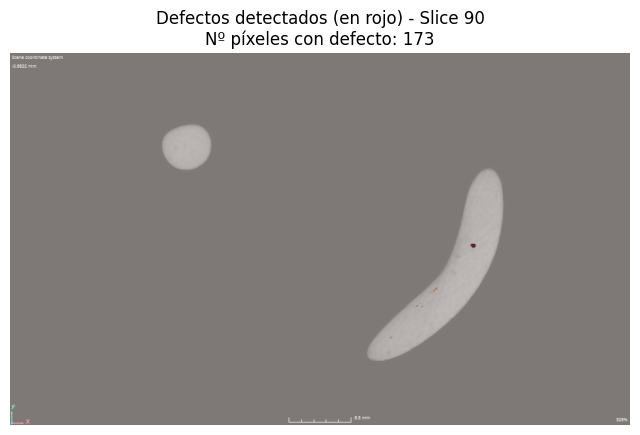

Slice 91: 152 píxeles con defecto


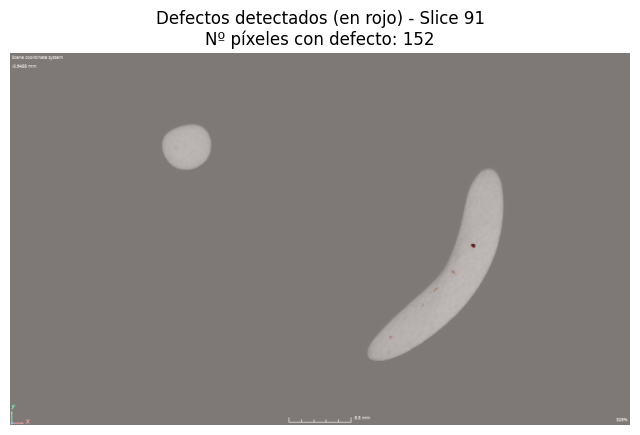

Slice 92: 198 píxeles con defecto


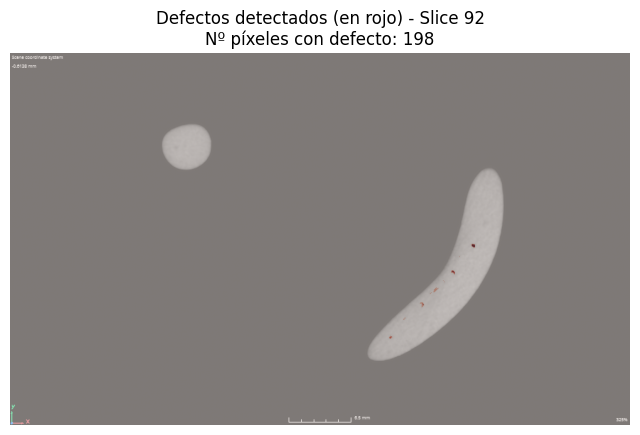

Slice 93: 148 píxeles con defecto


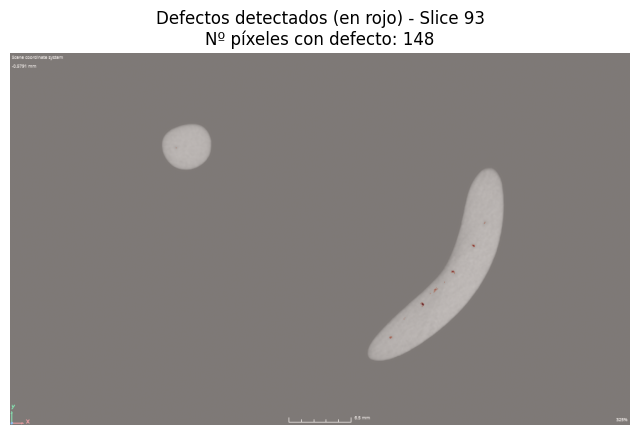

Slice 94: 217 píxeles con defecto


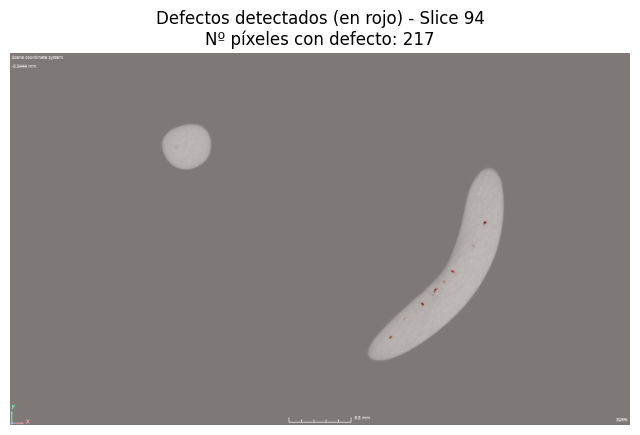

Slice 95: 215 píxeles con defecto


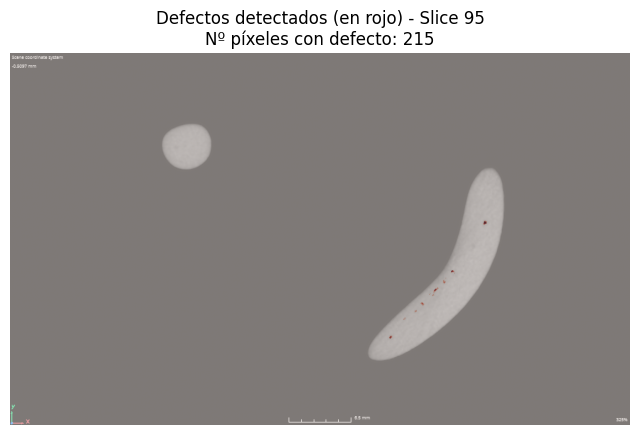

In [31]:
# ...existing code...

import numpy as np
from scipy.ndimage import binary_erosion
import matplotlib.pyplot as plt

# --- Parámetros ---
umbral = 0.13         # Umbral para considerar un píxel como defecto
umbral_pieza = 0.2     # Umbral para la máscara de la pieza
iterations = 15         # Iteraciones de erosión para eliminar borde

# --- Máscara de defecto ---
mascara_defecto = (error_map > umbral).float()

# --- Máscara de la pieza y erosión ---
mask_pieza = (input_def.cpu().sum(dim=1, keepdim=True) > umbral_pieza).float()
mask_np = mask_pieza.numpy().astype(bool)
mask_eroded = np.zeros_like(mask_np)
for b in range(mask_np.shape[0]):
    for d in range(mask_np.shape[2]):
        mask_eroded[b, 0, d] = binary_erosion(mask_np[b, 0, d], iterations=iterations)
mask_eroded = torch.tensor(mask_eroded, dtype=torch.float32)

# --- Defectos solo en el interior ---
mascara_defecto_interior = mascara_defecto * mask_eroded
num_defectos_interior = mascara_defecto_interior.sum().item()
print(f"Número de píxeles con defecto (solo interior de la pieza): {num_defectos_interior}")

# --- Visualización de una sola slice ---
for depth in range(mascara_defecto_interior.shape[2]):
    real_img = input_def.cpu()[0, :, depth].permute(1, 2, 0).numpy()
    defectos_slice = mascara_defecto_interior[0, :, depth].sum(dim=0).cpu()
    num_defectos_slice = defectos_slice.sum().item()
    print(f"Slice {depth}: {int(num_defectos_slice)} píxeles con defecto")
    plt.figure(figsize=(8, 8))
    plt.imshow(real_img, cmap='gray')
    plt.imshow(defectos_slice, cmap='Reds', alpha=0.5)
    plt.title(f"Defectos detectados (en rojo) - Slice {depth}\nNº píxeles con defecto: {int(num_defectos_slice)}")
    plt.axis('off')
    plt.show()

Vamos a ver como se podrían reconstruir los volúmenes.